In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
import os
from natsort import natsorted
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import scipy.signal
from scipy.signal import find_peaks
import sys
from scipy.fft import rfft, rfftfreq
from scipy.ndimage import gaussian_filter
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [3]:
video = cv2.VideoCapture('/content/drive/MyDrive/everglow/cohface/1/1/data.avi')

fps = video.get(cv2.CAP_PROP_FPS)

# 비디오의 너비와 높이 가져오기
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

print('FPS:', fps)
print('Resolution: {}x{}'.format(width, height))

# 비디오 객체 해제
video.release()

FPS: 20.0
Resolution: 640x480


In [4]:
def print_hdf5_file_structure(hdf5_file_path):
    with h5py.File(hdf5_file_path, 'r') as file:
        def recursive_print(name, obj):
            print(name)
            if isinstance(obj, h5py.Dataset):
                print("  Dataset shape: ", obj.shape)
                print("  Dataset dtype: ", obj.dtype)
            elif isinstance(obj, h5py.Group):
                print("  Group")

        file.visititems(recursive_print)

# HDF5 파일 경로 지정
file_path = '/content/drive/MyDrive/everglow/cohface/1/1/data.hdf5'
print_hdf5_file_structure(file_path)


pulse
  Dataset shape:  (15456,)
  Dataset dtype:  float64
respiration
  Dataset shape:  (15456,)
  Dataset dtype:  float64
time
  Dataset shape:  (15456,)
  Dataset dtype:  float64


In [14]:
npz_file_path = '/content/drive/MyDrive/everglow/cohface-npz/10_0.npz'

data = np.load(npz_file_path)
print(data['video'].shape)
print(data['pulse'].shape)

(1227, 64, 64, 3)
(15728,)


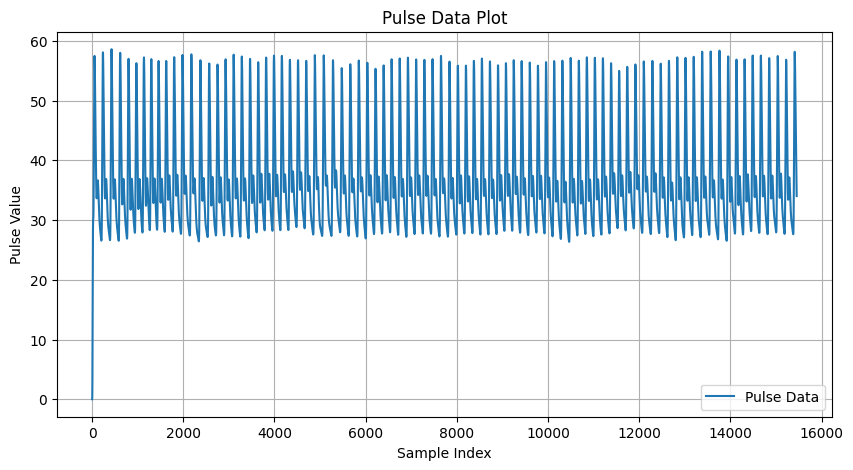

In [5]:
with h5py.File(file_path, 'r') as file:
    # 데이터셋 접근
    dataset = file['pulse']
    data = dataset[:]  # 데이터셋의 모든 데이터 읽기

    # 데이터 플롯
    plt.figure(figsize=(10, 5))
    plt.plot(data, label='Pulse Data')
    plt.title('Pulse Data Plot')
    plt.xlabel('Sample Index')
    plt.ylabel('Pulse Value')
    plt.legend()
    plt.grid(True)
    plt.show()

In [8]:
# 미분을 계산하기 위한 함수 정의
def derivative(signal):
    # 중앙 차분을 사용하여 미분 계산
    return np.gradient(signal)

In [9]:
# 이 함수는 npz 파일에서 비디오 데이터를 로드하고, 그린 채널의 변화량을 계산하여 신호로 변환하는 데 사용됩니다.
def extract_green_channel_signal(npz_data):
    video_data = npz_data['video']  # (frame_number, height, width, channels)
    green_channel = video_data[:, :, :, 1]  # 그린 채널 추출

    # 각 프레임에 대한 그린 채널의 평균값 계산
    green_channel_mean = green_channel.mean(axis=(1, 2))
    smoothed_wave = gaussian_filter(green_channel_mean, sigma=2)
    diff_smoothed_wave = derivative(smoothed_wave)

    return diff_smoothed_wave

In [39]:
def calculate_hr(npz_data, fps_rppg=20, fps_ppg=256, window_size_rppg=100, step_size_rppg=20, window_size_ppg=768, step_size_ppg=256):
    rPPG_Signal = extract_green_channel_signal(npz_data)
    PPG_Signal = npz_data['pulse']

    # RPPG 심박수 계산
    bpm_per_frame_rppg, times_rppg = [], []
    for start in range(0, len(rPPG_Signal) - window_size_rppg, step_size_rppg):
        end = start + window_size_rppg
        segment = rPPG_Signal[start:end]
        peaks, _ = find_peaks(segment, distance=fps_rppg//2)
        if len(peaks) > 1:
            ibi = np.diff(peaks) / fps_rppg
            bpm = 60 / np.mean(ibi) if len(ibi) > 0 else np.nan
        else:
            bpm = np.nan
        bpm_per_frame_rppg.append(bpm)
        times_rppg.append((start + end) / 2 / fps_rppg)

    # PPG 심박수 계산
    bpm_per_frame_ppg, times_ppg = [], []
    for start in range(0, len(PPG_Signal) - window_size_ppg, step_size_ppg):
        end = start + window_size_ppg
        segment = PPG_Signal[start:end]
        peaks, _ = find_peaks(segment, distance=fps_ppg//2)
        if len(peaks) > 1:
            ibi = np.diff(peaks) / fps_ppg
            bpm = 60 / np.mean(ibi) if len(ibi) > 0 else np.nan
        else:
            bpm = np.nan
        bpm_per_frame_ppg.append(bpm)
        times_ppg.append((start + end) / 2 / fps_ppg)

    return times_rppg, bpm_per_frame_rppg, times_ppg, bpm_per_frame_ppg

def plot_hr(times_rppg, bpm_rppg, times_ppg, bpm_ppg):
    plt.figure(figsize=(20, 5))
    plt.plot(times_rppg, bpm_rppg, label='Estimated Heart Rate from rPPG', color='blue')
    plt.plot(times_ppg, bpm_ppg, label='Estimated Heart Rate from PPG', color='red')
    plt.title('Comparison of Heart Rates Estimated from rPPG and PPG')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Heart Rate (BPM)')
    plt.legend()
    plt.show()

def plot_hr(times_rppg, bpm_rppg, times_ppg, bpm_ppg):
    plt.figure(figsize=(20, 5))
    plt.plot(times_rppg, bpm_rppg, label='Estimated Heart Rate from rPPG', color='blue')
    plt.plot(times_ppg, bpm_ppg, label='Estimated Heart Rate from PPG', color='red')
    plt.title('Comparison of Heart Rates Estimated from rPPG and PPG')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Heart Rate (BPM)')
    plt.legend()
    plt.show()

    # 비디오로 계산된 BPM과 pulse 신호로 계산된 BPM의 평균 계산
    # NaN 값을 무시하고 평균 계산
    # 계산된 BPM과 실제 HR의 평균 및 오류 메트릭 계산
    mean_estimated_rppg = np.nanmean(bpm_rppg)
    mean_actual_ppg = np.nanmean(bpm_ppg)

    mae, rmse = calculate_errors(bpm_rppg, bpm_ppg)

    # 결과 출력
    print(f"Average Estimated Heart Rate based Video: {mean_estimated_rppg:.2f}")
    print(f"Average Estimated Heart Rate based Pulse: {mean_actual_ppg:.2f}")
    print(f"MAE: {mae:.2f}")
    # print(f"MSE: {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print("---------------------------------------------------------------------------")

    return rmse, mae

def calculate_errors(bpm_per_frame_rPPG, bpm_per_frame_ppg):
    # 두 배열 중 더 짧은 길이를 사용하여 두 배열을 같은 길이로 조정합니다.
    min_length = min(len(bpm_per_frame_rPPG), len(bpm_per_frame_ppg))
    bpm_rppg_resized = bpm_per_frame_rPPG[:min_length]
    bpm_ppg_resized = bpm_per_frame_ppg[:min_length]

    # NaN이 아닌 인덱스를 찾습니다.
    valid_indices = ~np.isnan(bpm_rppg_resized) & ~np.isnan(bpm_ppg_resized)

    # 유효한 인덱스만 사용하여 데이터를 필터링합니다.
    filtered_rppg = np.array(bpm_rppg_resized)[valid_indices]
    filtered_ppg = np.array(bpm_ppg_resized)[valid_indices]

    # MAE와 RMSE를 계산합니다.
    mae = mean_absolute_error(filtered_ppg, filtered_rppg)
    rmse = np.sqrt(mean_squared_error(filtered_ppg, filtered_rppg))

    return mae, rmse

def process_npz_files(directory):
    """디렉토리 내의 모든 NPZ 파일 처리"""
    mse_list, rmse_list, mae_list = [], [], []
    subject_list = []
    for file_name in sorted(os.listdir(directory)):
        if file_name.endswith('.npz'):
            file_path = os.path.join(directory, file_name)
            print(f"Processing {file_path}...")
            npz_data = np.load(file_path)
            times_rppg, bpm_rppg, times_ppg, bpm_ppg = calculate_hr(npz_data)

            rmse, mae = plot_hr(times_rppg, bpm_rppg, times_ppg, bpm_ppg)
            # mse_list.append(mse)
            rmse_list.append(rmse)
            mae_list.append(mae)
            subject_list.append(file_name.replace('.npz', ''))

    return rmse_list, mae_list, subject_list


Processing /content/drive/MyDrive/everglow/cohface-npz/10_0.npz...


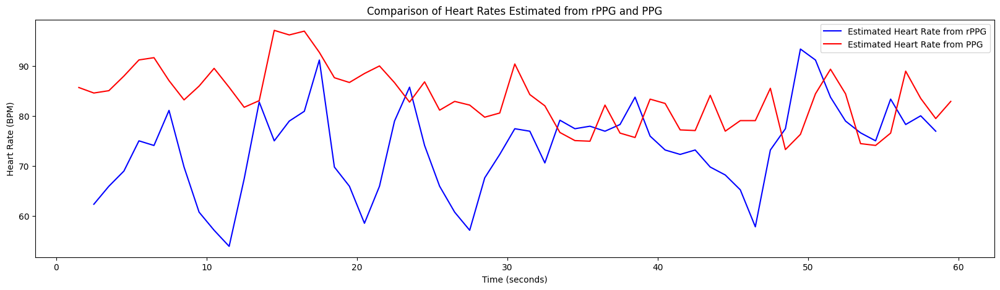

Average Estimated Heart Rate based Video: 73.50
Average Estimated Heart Rate based Pulse: 83.55
MAE: 12.26
RMSE: 14.84
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/10_1.npz...


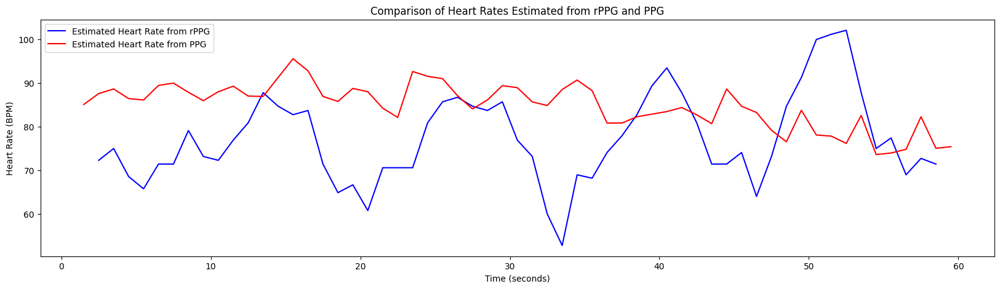

Average Estimated Heart Rate based Video: 77.23
Average Estimated Heart Rate based Pulse: 84.87
MAE: 12.33
RMSE: 14.44
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/10_2.npz...


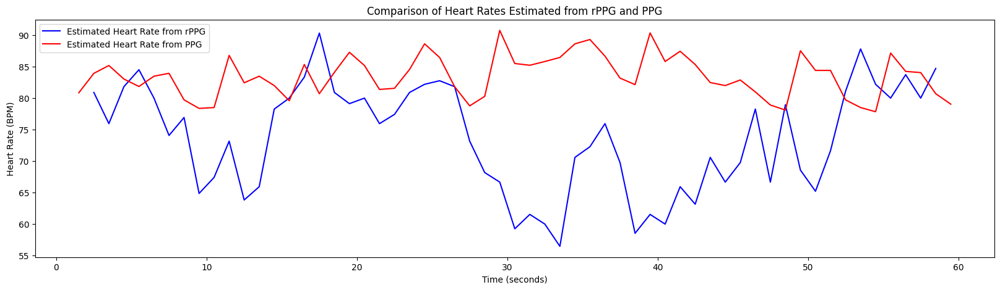

Average Estimated Heart Rate based Video: 73.71
Average Estimated Heart Rate based Pulse: 83.47
MAE: 10.77
RMSE: 13.75
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/10_3.npz...


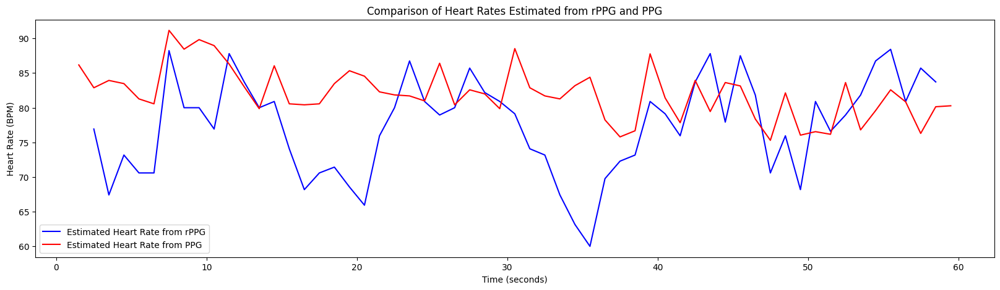

Average Estimated Heart Rate based Video: 77.40
Average Estimated Heart Rate based Pulse: 82.02
MAE: 7.36
RMSE: 9.16
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/11_0.npz...


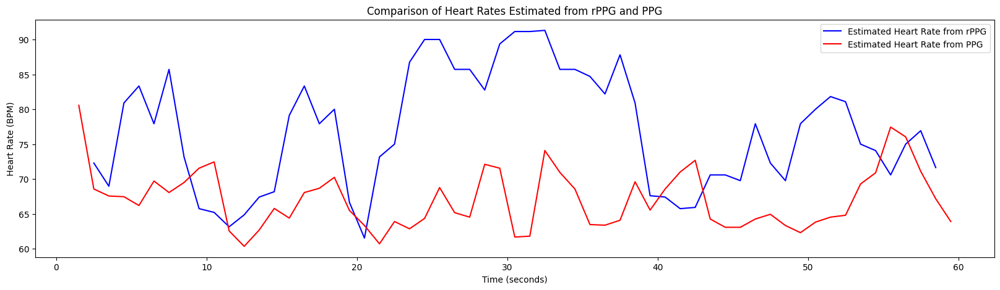

Average Estimated Heart Rate based Video: 76.95
Average Estimated Heart Rate based Pulse: 67.07
MAE: 11.58
RMSE: 13.98
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/11_1.npz...


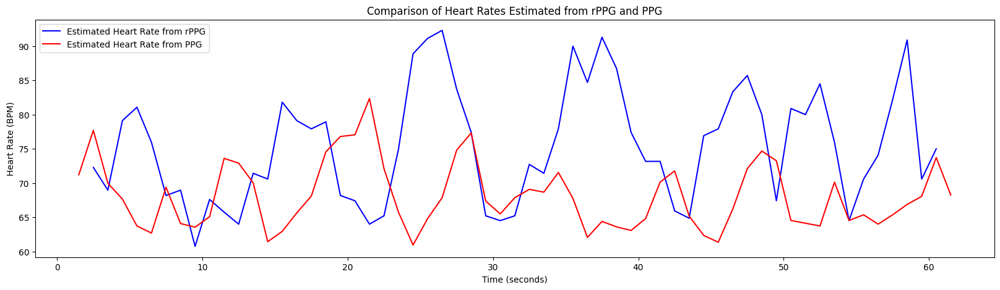

Average Estimated Heart Rate based Video: 75.44
Average Estimated Heart Rate based Pulse: 68.13
MAE: 11.09
RMSE: 13.49
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/11_2.npz...


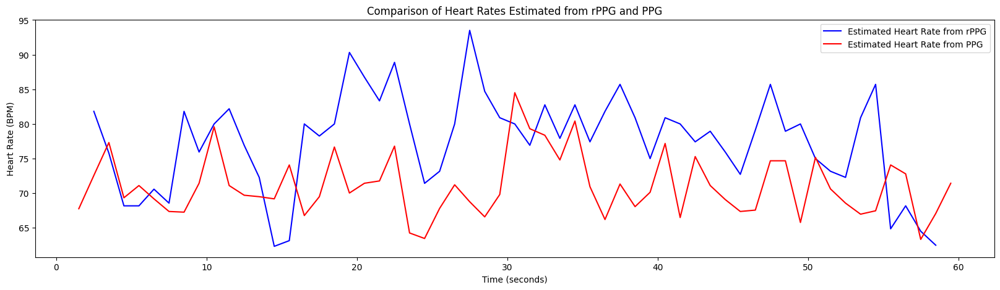

Average Estimated Heart Rate based Video: 77.49
Average Estimated Heart Rate based Pulse: 71.06
MAE: 8.31
RMSE: 9.93
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/11_3.npz...


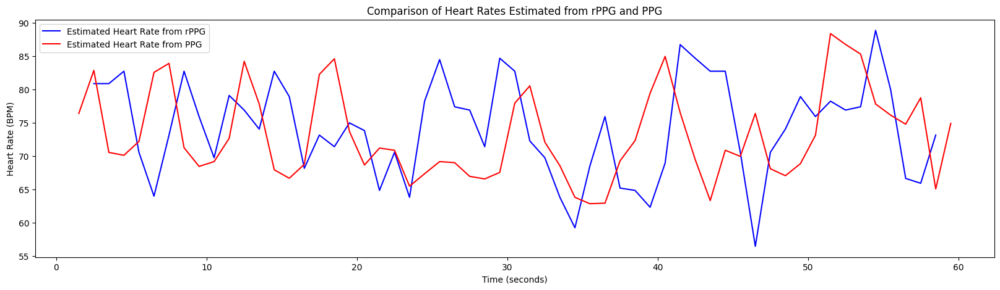

Average Estimated Heart Rate based Video: 74.24
Average Estimated Heart Rate based Pulse: 73.16
MAE: 7.50
RMSE: 8.83
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/12_0.npz...


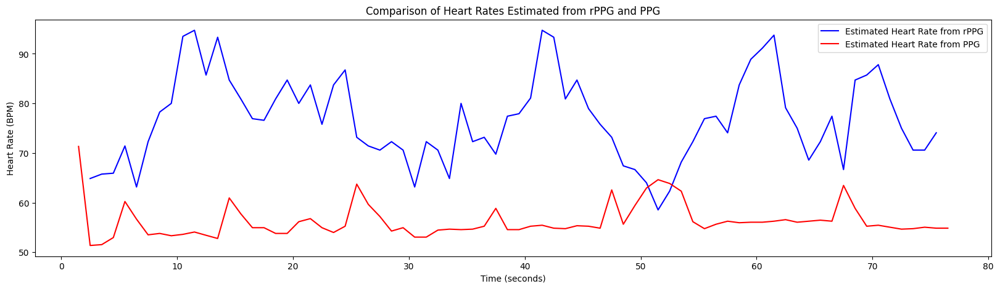

Average Estimated Heart Rate based Video: 76.75
Average Estimated Heart Rate based Pulse: 56.29
MAE: 20.78
RMSE: 22.87
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/12_1.npz...


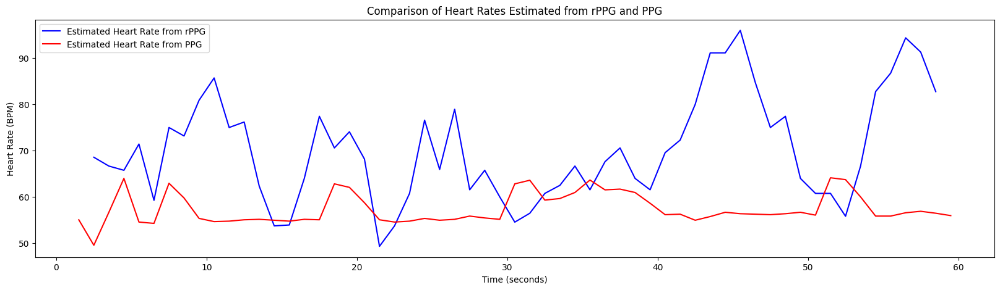

Average Estimated Heart Rate based Video: 70.24
Average Estimated Heart Rate based Pulse: 57.42
MAE: 13.88
RMSE: 17.66
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/12_2.npz...


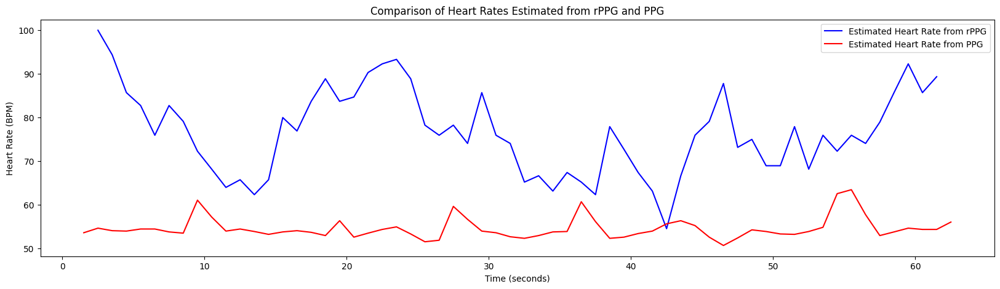

Average Estimated Heart Rate based Video: 76.70
Average Estimated Heart Rate based Pulse: 54.60
MAE: 22.12
RMSE: 24.39
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/12_3.npz...


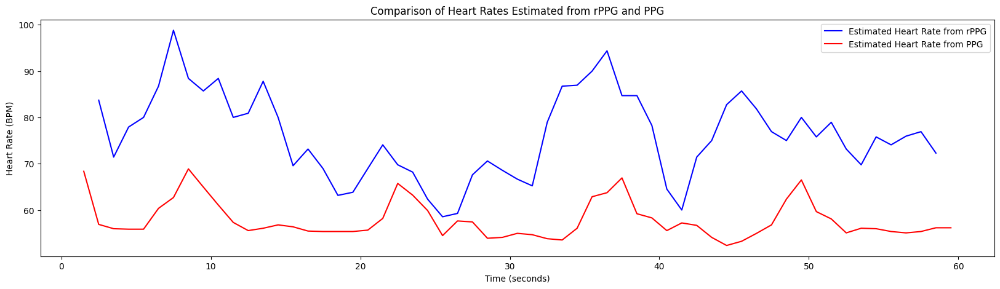

Average Estimated Heart Rate based Video: 76.12
Average Estimated Heart Rate based Pulse: 57.82
MAE: 18.32
RMSE: 20.31
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/13_0.npz...


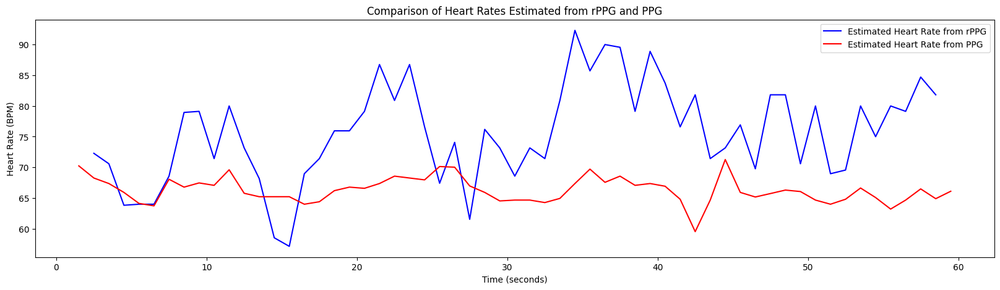

Average Estimated Heart Rate based Video: 75.63
Average Estimated Heart Rate based Pulse: 66.29
MAE: 10.35
RMSE: 12.13
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/13_1.npz...


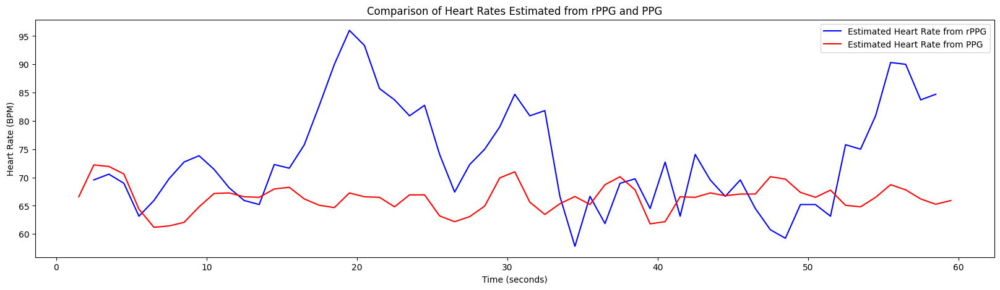

Average Estimated Heart Rate based Video: 73.44
Average Estimated Heart Rate based Pulse: 66.41
MAE: 9.09
RMSE: 11.78
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/13_2.npz...


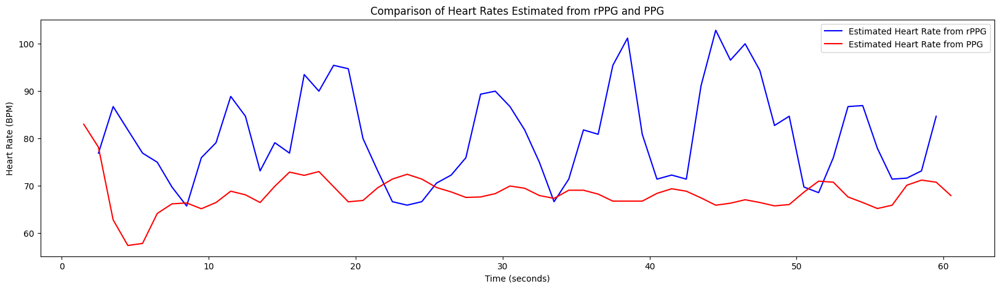

Average Estimated Heart Rate based Video: 80.54
Average Estimated Heart Rate based Pulse: 68.32
MAE: 13.06
RMSE: 16.01
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/13_3.npz...


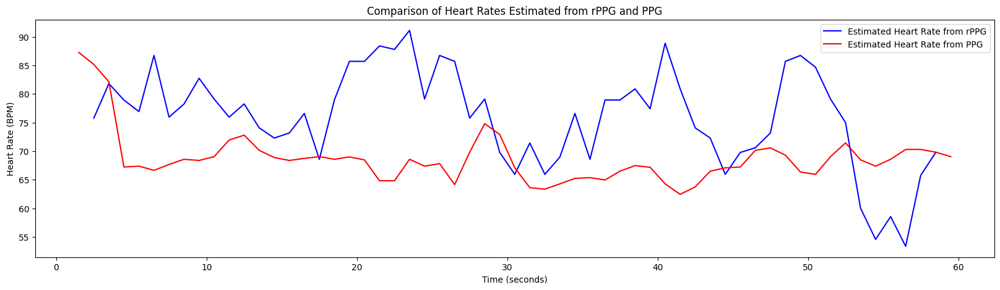

Average Estimated Heart Rate based Video: 75.99
Average Estimated Heart Rate based Pulse: 68.70
MAE: 10.31
RMSE: 12.10
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/14_0.npz...


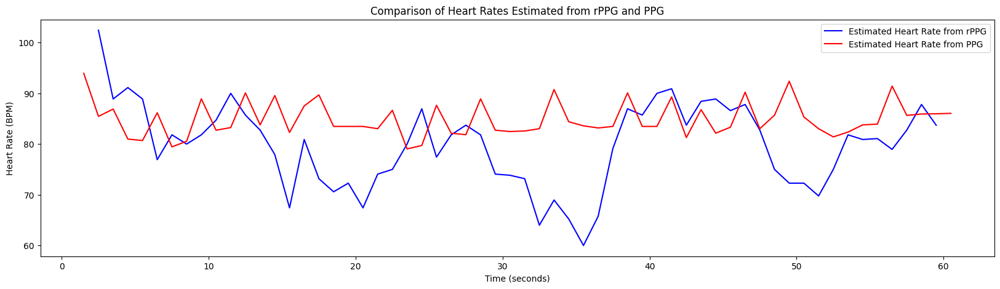

Average Estimated Heart Rate based Video: 79.71
Average Estimated Heart Rate based Pulse: 84.89
MAE: 8.02
RMSE: 10.18
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/14_1.npz...


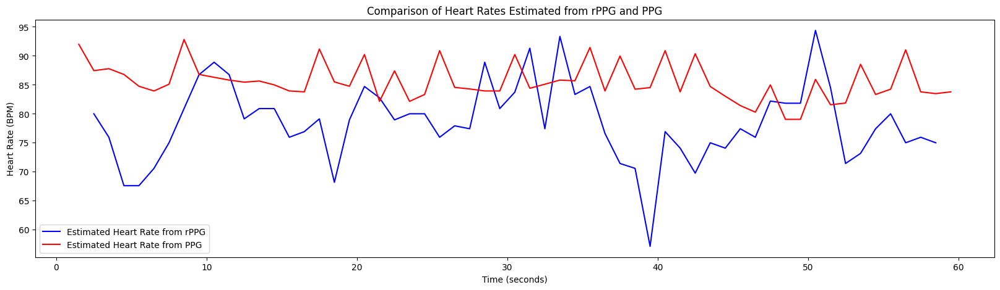

Average Estimated Heart Rate based Video: 78.47
Average Estimated Heart Rate based Pulse: 85.55
MAE: 8.43
RMSE: 10.39
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/14_2.npz...


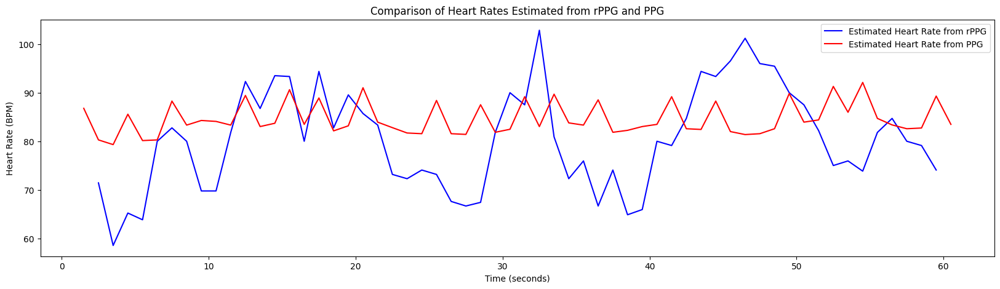

Average Estimated Heart Rate based Video: 80.46
Average Estimated Heart Rate based Pulse: 84.60
MAE: 9.78
RMSE: 11.26
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/14_3.npz...


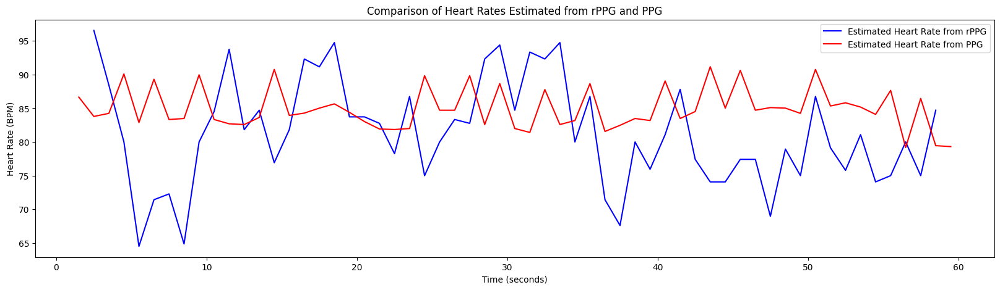

Average Estimated Heart Rate based Video: 81.29
Average Estimated Heart Rate based Pulse: 84.94
MAE: 7.58
RMSE: 9.24
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/15_0.npz...


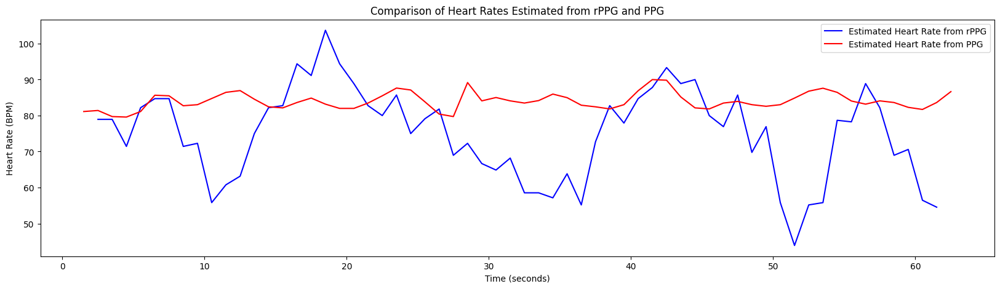

Average Estimated Heart Rate based Video: 74.87
Average Estimated Heart Rate based Pulse: 84.01
MAE: 11.84
RMSE: 15.60
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/15_1.npz...


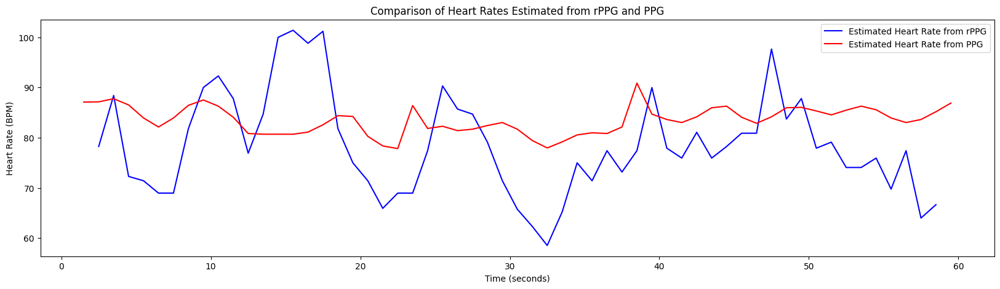

Average Estimated Heart Rate based Video: 78.59
Average Estimated Heart Rate based Pulse: 83.53
MAE: 9.24
RMSE: 10.98
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/15_2.npz...


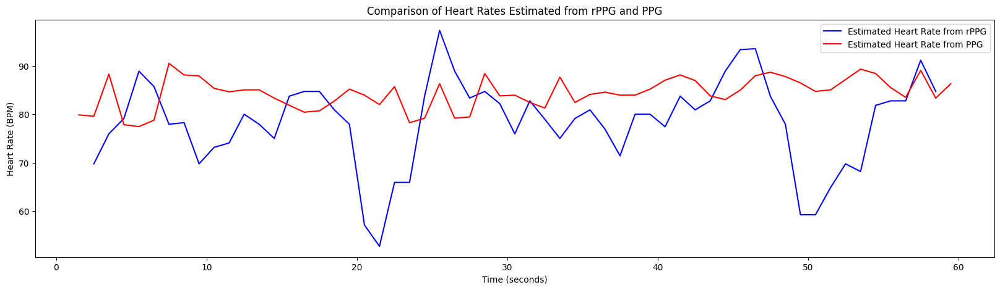

Average Estimated Heart Rate based Video: 78.37
Average Estimated Heart Rate based Pulse: 84.32
MAE: 9.24
RMSE: 11.80
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/15_3.npz...


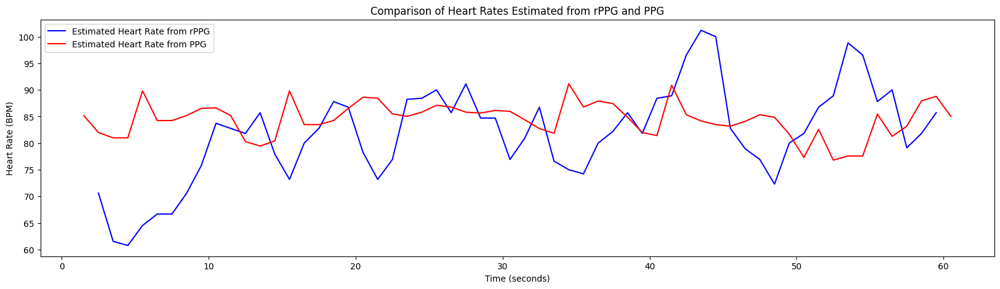

Average Estimated Heart Rate based Video: 81.80
Average Estimated Heart Rate based Pulse: 84.44
MAE: 7.81
RMSE: 9.96
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/16_0.npz...


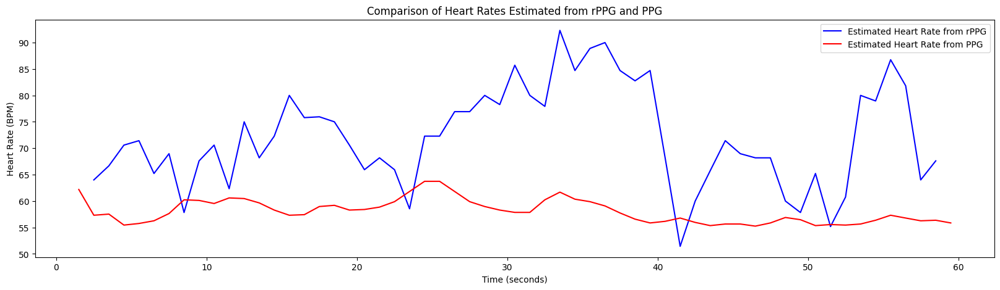

Average Estimated Heart Rate based Video: 72.02
Average Estimated Heart Rate based Pulse: 58.06
MAE: 14.11
RMSE: 16.48
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/16_1.npz...


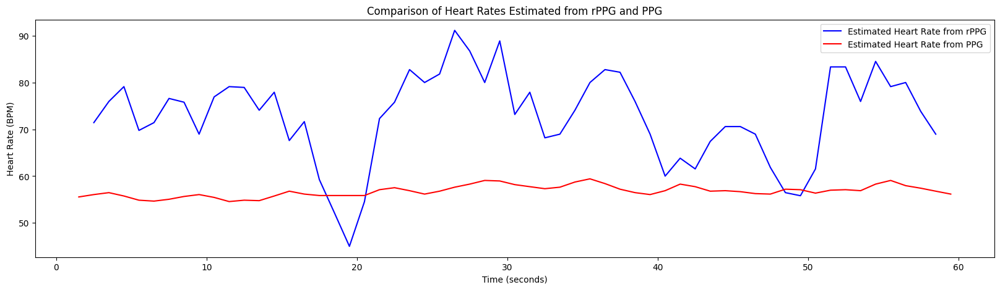

Average Estimated Heart Rate based Video: 72.73
Average Estimated Heart Rate based Pulse: 56.79
MAE: 16.53
RMSE: 18.39
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/16_2.npz...


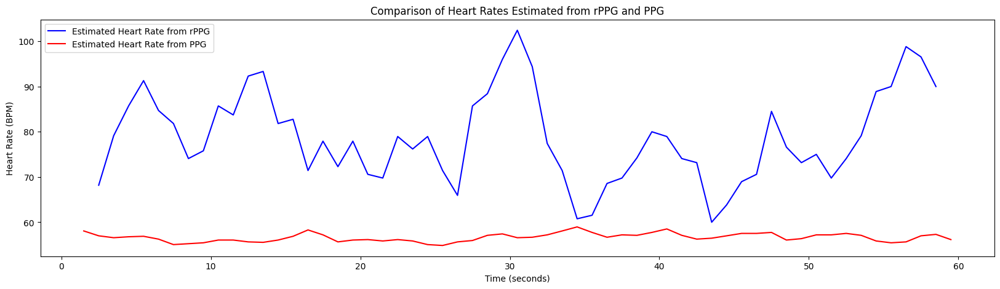

Average Estimated Heart Rate based Video: 78.75
Average Estimated Heart Rate based Pulse: 56.64
MAE: 22.11
RMSE: 24.31
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/16_3.npz...


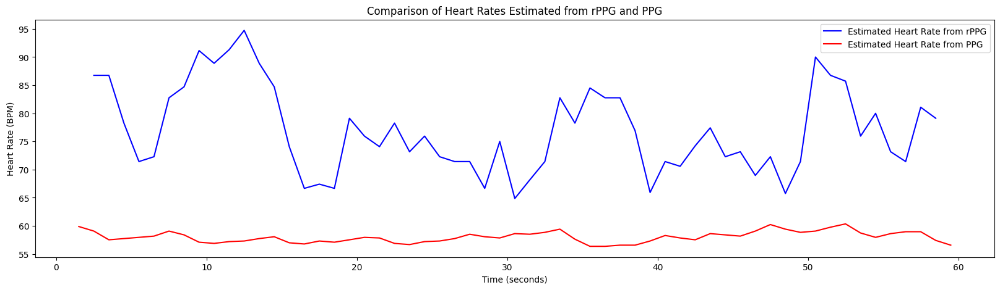

Average Estimated Heart Rate based Video: 77.02
Average Estimated Heart Rate based Pulse: 58.02
MAE: 18.96
RMSE: 20.41
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/17_0.npz...


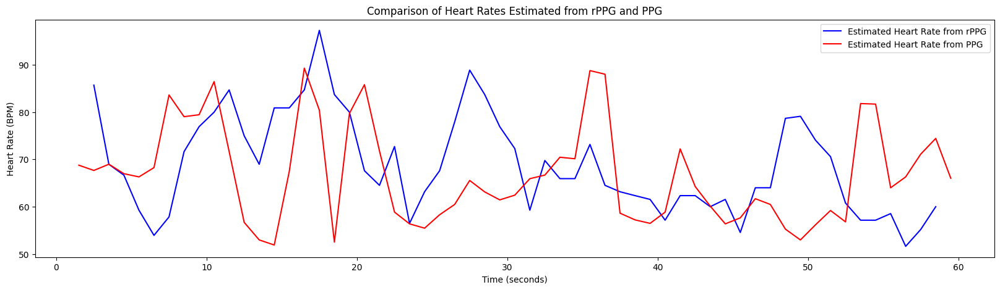

Average Estimated Heart Rate based Video: 68.83
Average Estimated Heart Rate based Pulse: 66.74
MAE: 10.66
RMSE: 13.82
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/17_1.npz...


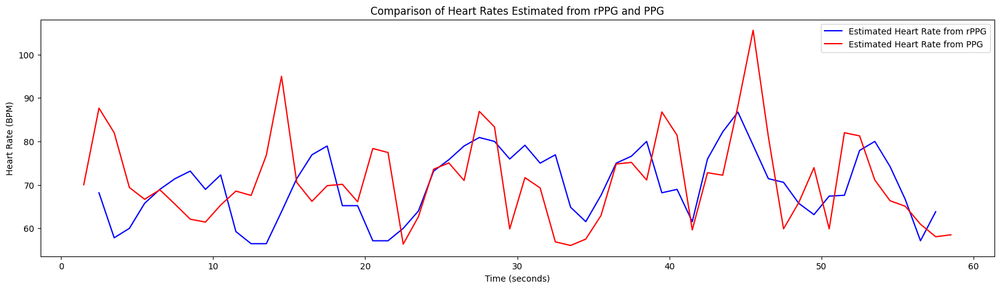

Average Estimated Heart Rate based Video: 69.79
Average Estimated Heart Rate based Pulse: 71.05
MAE: 9.42
RMSE: 11.82
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/17_2.npz...


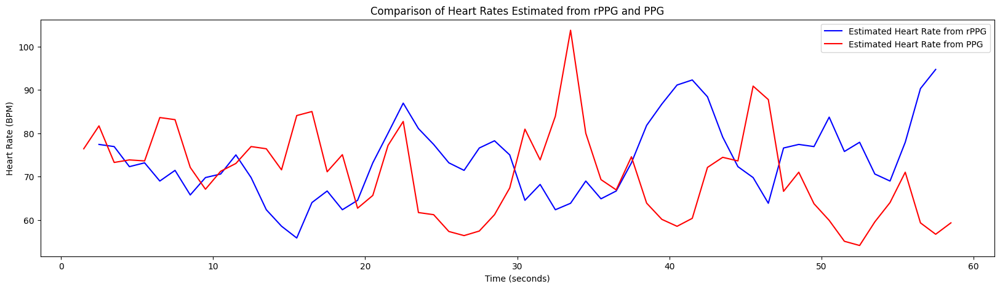

Average Estimated Heart Rate based Video: 73.70
Average Estimated Heart Rate based Pulse: 70.61
MAE: 13.28
RMSE: 16.03
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/17_3.npz...


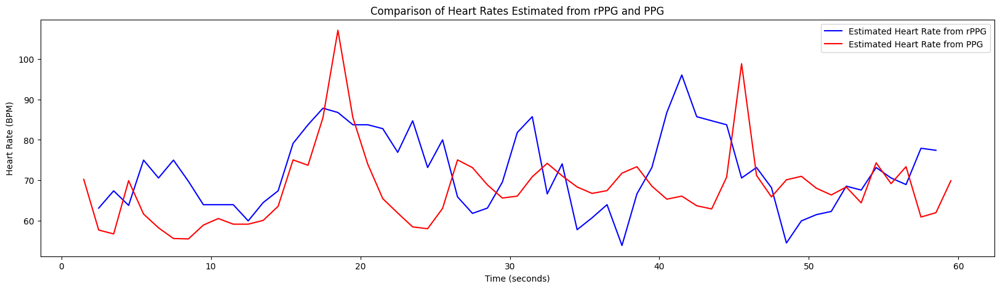

Average Estimated Heart Rate based Video: 72.07
Average Estimated Heart Rate based Pulse: 68.13
MAE: 9.91
RMSE: 12.41
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/18_0.npz...


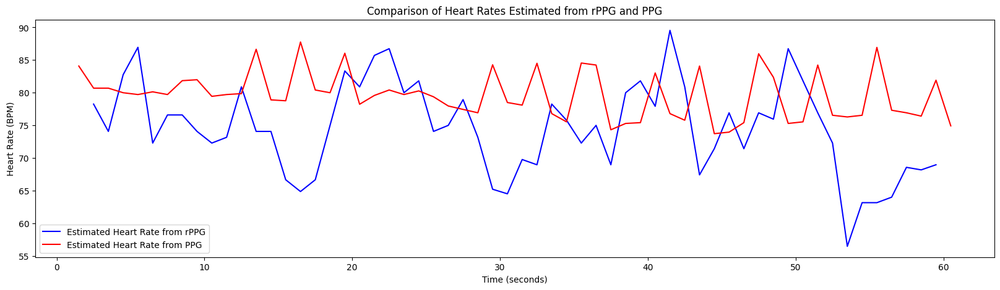

Average Estimated Heart Rate based Video: 74.63
Average Estimated Heart Rate based Pulse: 79.63
MAE: 7.59
RMSE: 9.18
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/18_1.npz...


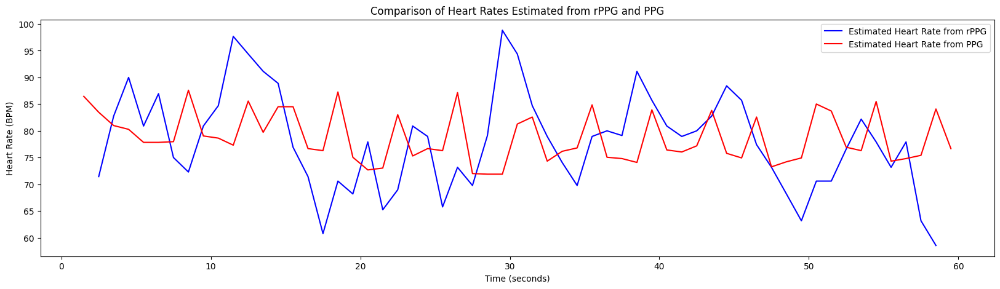

Average Estimated Heart Rate based Video: 78.06
Average Estimated Heart Rate based Pulse: 78.69
MAE: 8.13
RMSE: 10.09
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/18_2.npz...


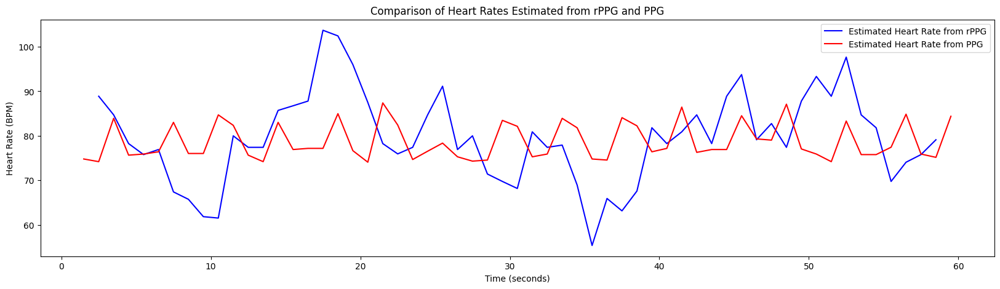

Average Estimated Heart Rate based Video: 79.58
Average Estimated Heart Rate based Pulse: 78.73
MAE: 8.54
RMSE: 10.98
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/18_3.npz...


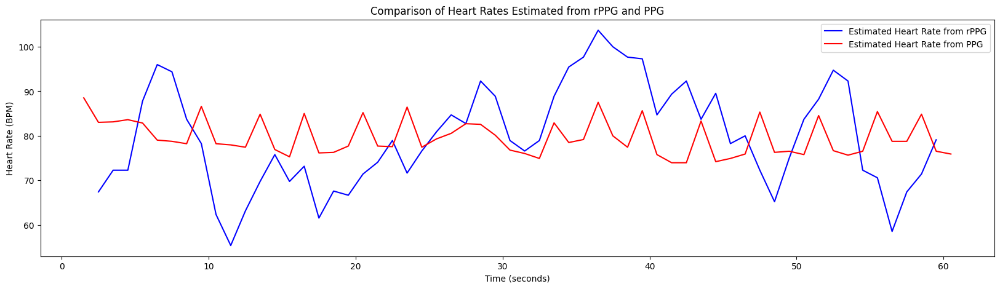

Average Estimated Heart Rate based Video: 79.72
Average Estimated Heart Rate based Pulse: 79.64
MAE: 10.09
RMSE: 12.25
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/19_0.npz...


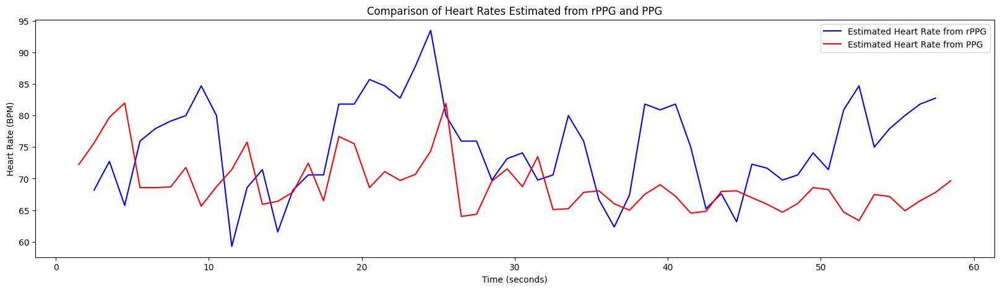

Average Estimated Heart Rate based Video: 75.05
Average Estimated Heart Rate based Pulse: 69.08
MAE: 8.47
RMSE: 10.14
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/19_1.npz...


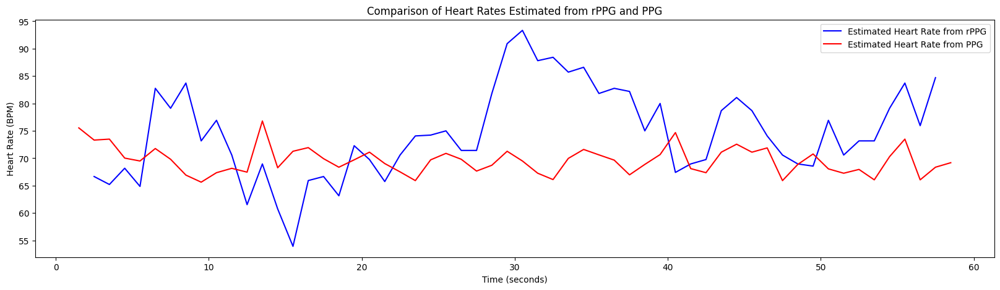

Average Estimated Heart Rate based Video: 74.59
Average Estimated Heart Rate based Pulse: 69.61
MAE: 8.44
RMSE: 10.32
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/19_2.npz...


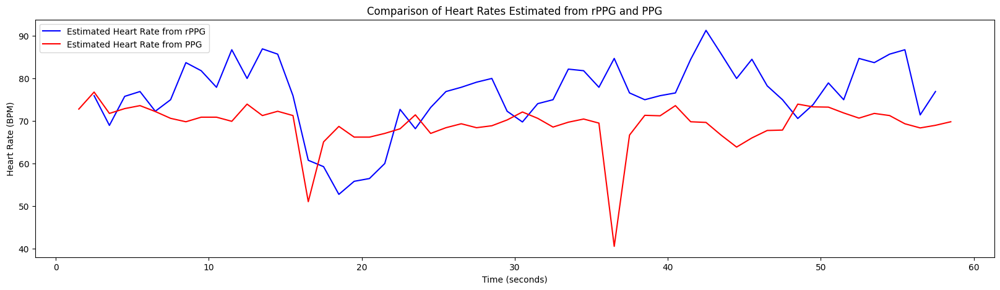

Average Estimated Heart Rate based Video: 76.17
Average Estimated Heart Rate based Pulse: 69.24
MAE: 9.13
RMSE: 11.11
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/19_3.npz...


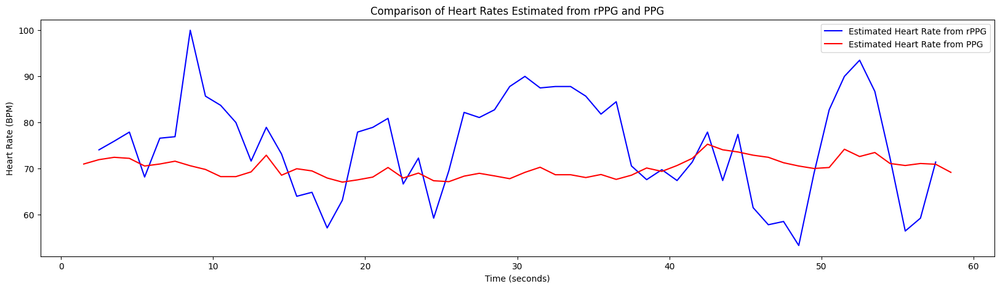

Average Estimated Heart Rate based Video: 74.98
Average Estimated Heart Rate based Pulse: 70.18
MAE: 9.92
RMSE: 11.98
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/1_0.npz...


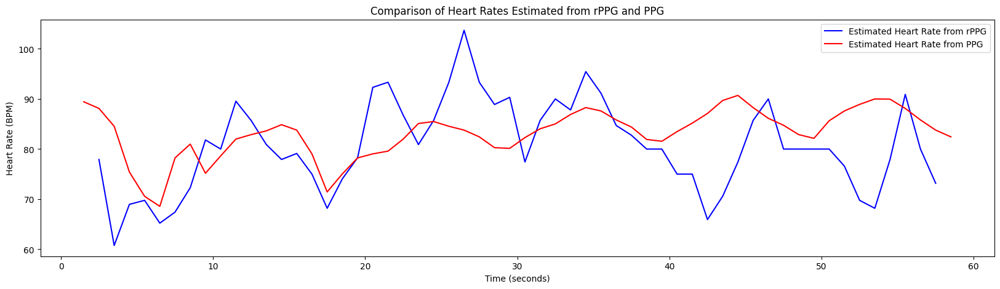

Average Estimated Heart Rate based Video: 80.58
Average Estimated Heart Rate based Pulse: 83.16
MAE: 7.64
RMSE: 9.61
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/1_1.npz...


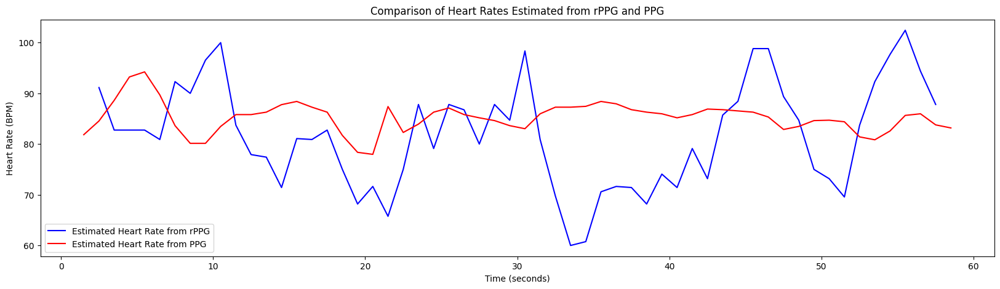

Average Estimated Heart Rate based Video: 81.70
Average Estimated Heart Rate based Pulse: 85.24
MAE: 9.67
RMSE: 11.70
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/1_2.npz...


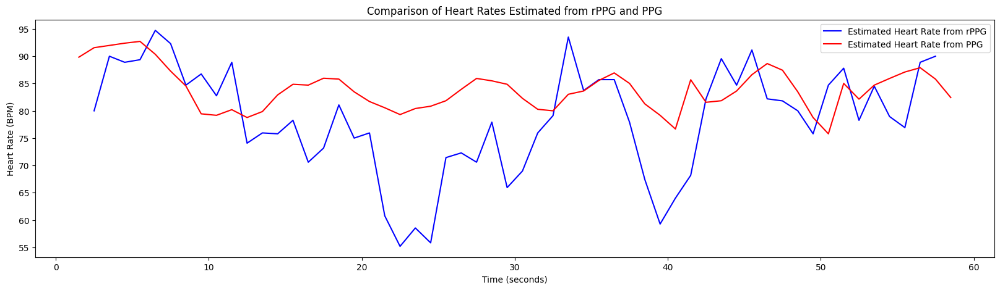

Average Estimated Heart Rate based Video: 78.46
Average Estimated Heart Rate based Pulse: 83.95
MAE: 8.28
RMSE: 10.45
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/1_3.npz...


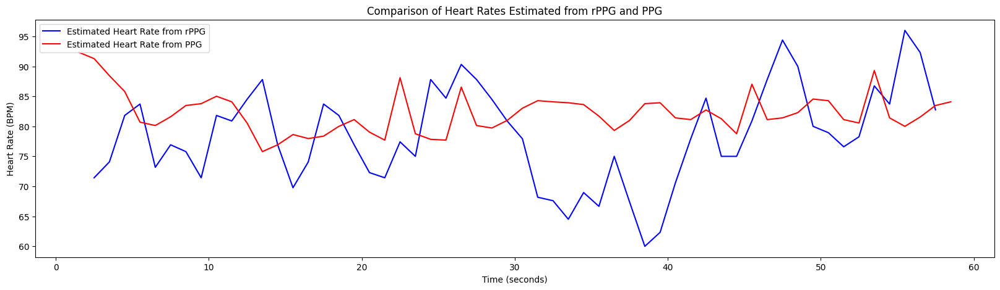

Average Estimated Heart Rate based Video: 78.38
Average Estimated Heart Rate based Pulse: 82.22
MAE: 7.93
RMSE: 9.85
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/20_0.npz...


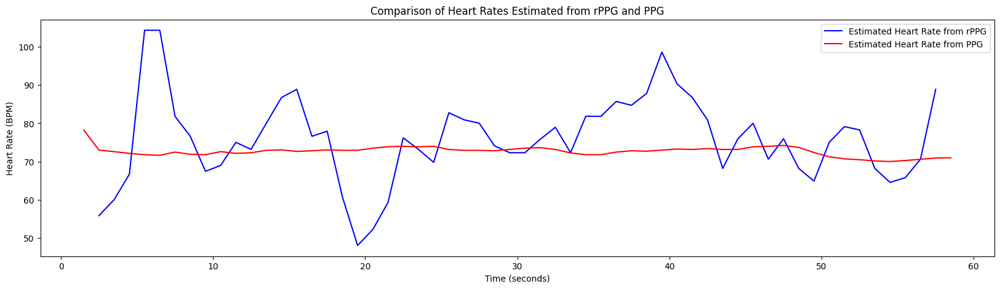

Average Estimated Heart Rate based Video: 75.81
Average Estimated Heart Rate based Pulse: 72.63
MAE: 8.95
RMSE: 11.85
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/20_1.npz...


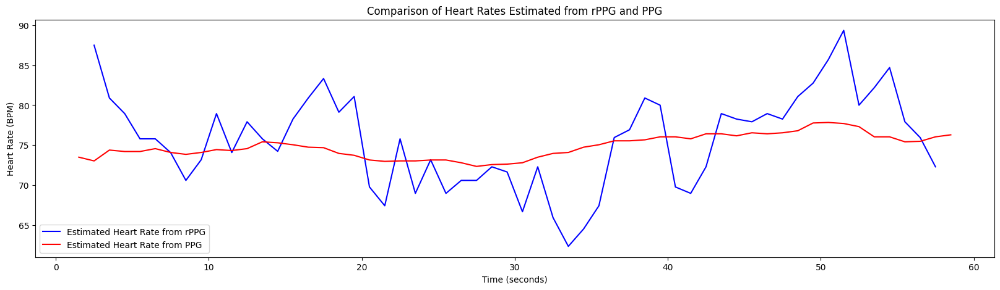

Average Estimated Heart Rate based Video: 75.68
Average Estimated Heart Rate based Pulse: 74.84
MAE: 4.18
RMSE: 5.25
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/20_2.npz...


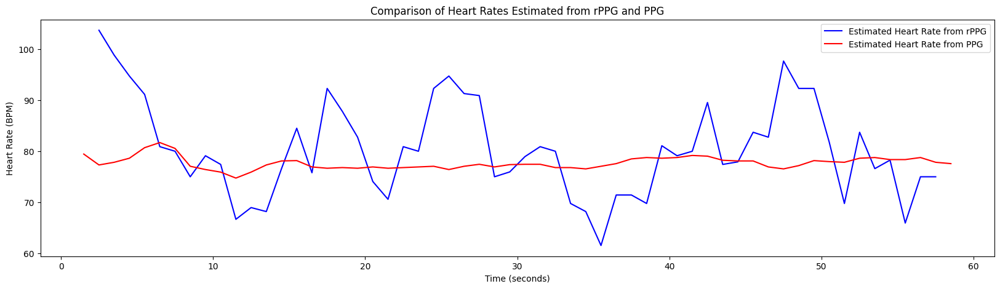

Average Estimated Heart Rate based Video: 80.39
Average Estimated Heart Rate based Pulse: 77.70
MAE: 7.30
RMSE: 9.54
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/20_3.npz...


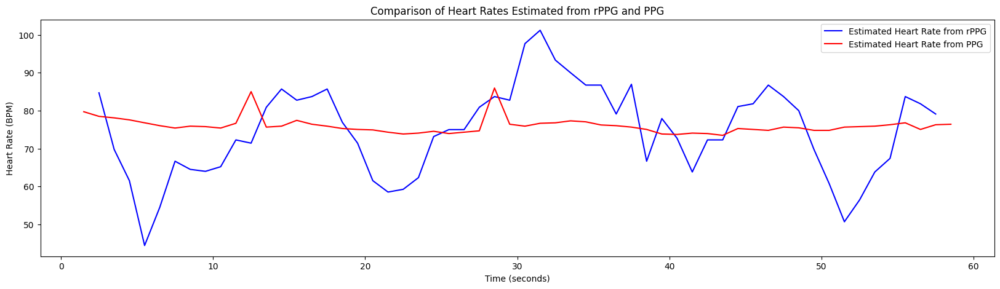

Average Estimated Heart Rate based Video: 74.52
Average Estimated Heart Rate based Pulse: 76.03
MAE: 9.48
RMSE: 11.65
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/21_0.npz...


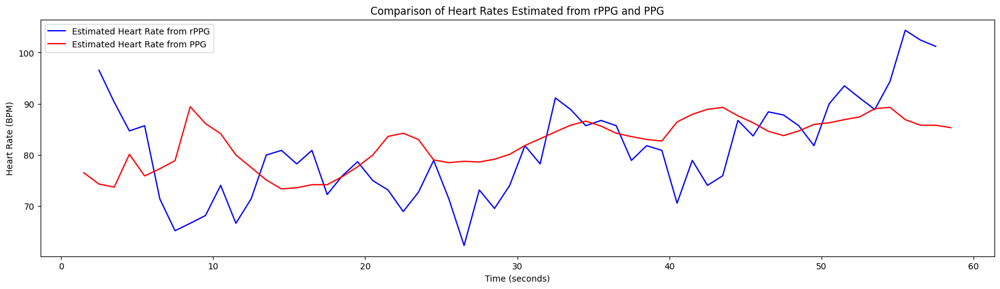

Average Estimated Heart Rate based Video: 80.84
Average Estimated Heart Rate based Pulse: 82.29
MAE: 7.31
RMSE: 9.14
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/21_1.npz...


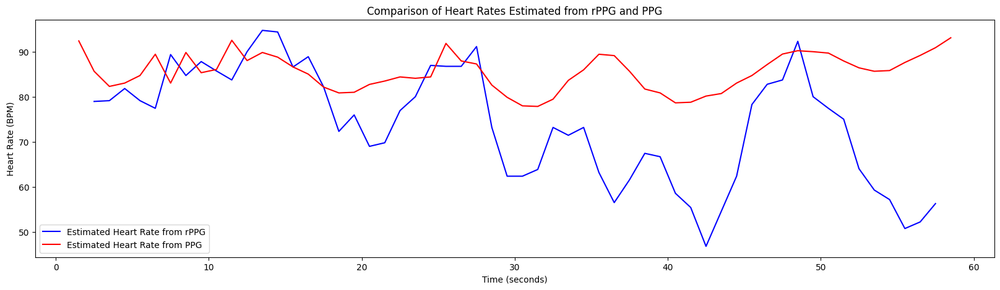

Average Estimated Heart Rate based Video: 73.95
Average Estimated Heart Rate based Pulse: 85.44
MAE: 12.22
RMSE: 16.07
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/21_2.npz...


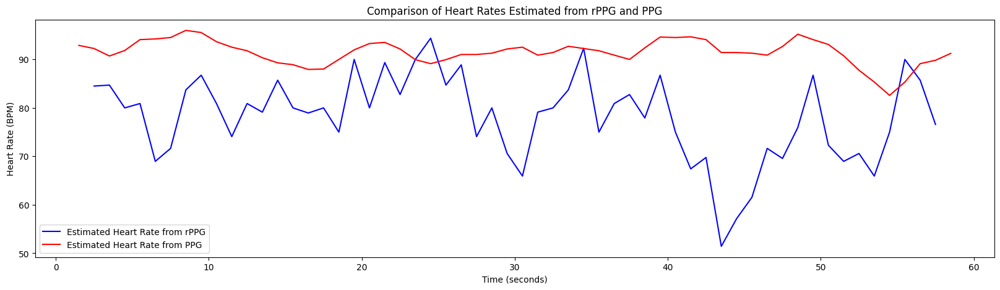

Average Estimated Heart Rate based Video: 78.15
Average Estimated Heart Rate based Pulse: 91.46
MAE: 13.79
RMSE: 16.36
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/21_3.npz...


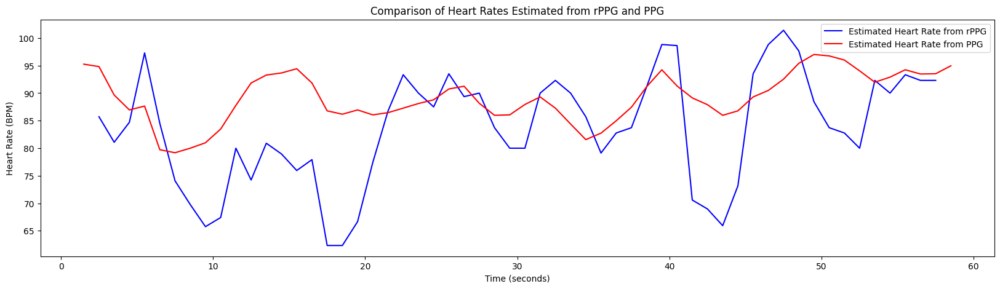

Average Estimated Heart Rate based Video: 83.55
Average Estimated Heart Rate based Pulse: 89.20
MAE: 8.44
RMSE: 10.96
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/22_0.npz...


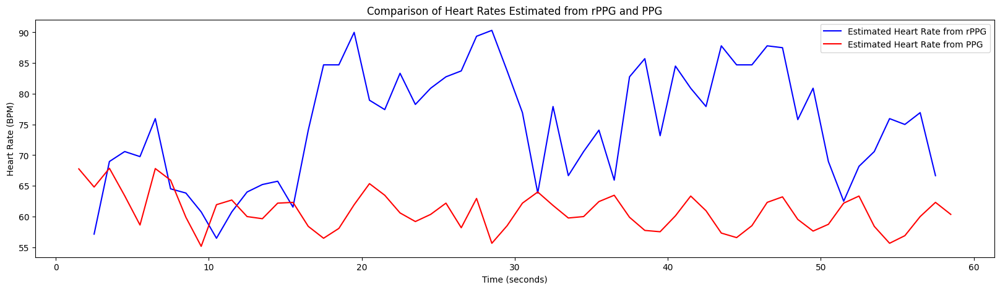

Average Estimated Heart Rate based Video: 75.04
Average Estimated Heart Rate based Pulse: 60.82
MAE: 14.88
RMSE: 17.71
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/22_1.npz...


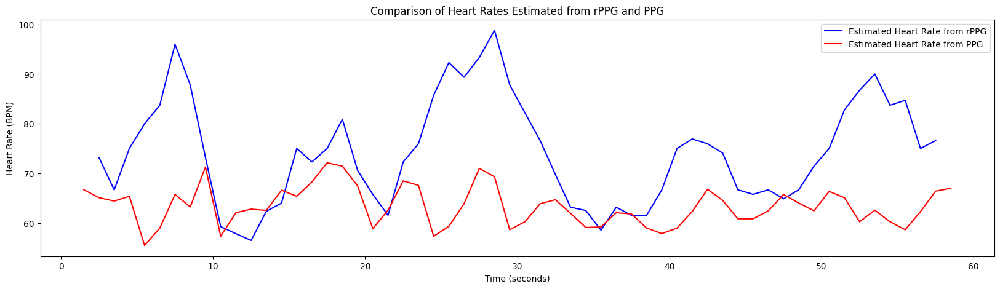

Average Estimated Heart Rate based Video: 74.22
Average Estimated Heart Rate based Pulse: 63.38
MAE: 11.79
RMSE: 15.45
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/22_2.npz...


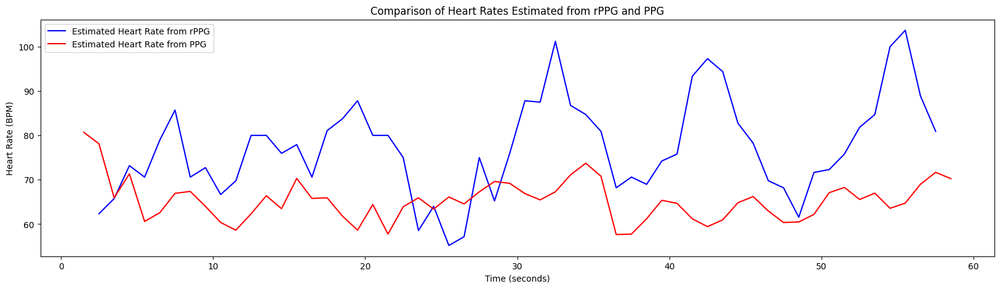

Average Estimated Heart Rate based Video: 77.34
Average Estimated Heart Rate based Pulse: 65.36
MAE: 14.35
RMSE: 17.30
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/22_3.npz...


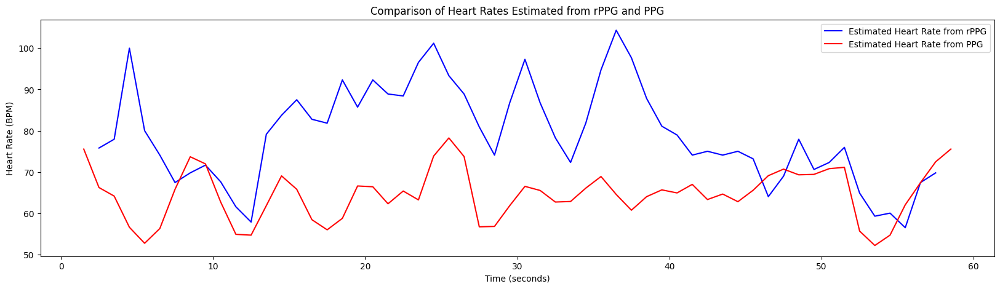

Average Estimated Heart Rate based Video: 79.07
Average Estimated Heart Rate based Pulse: 64.57
MAE: 15.38
RMSE: 19.04
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/23_0.npz...


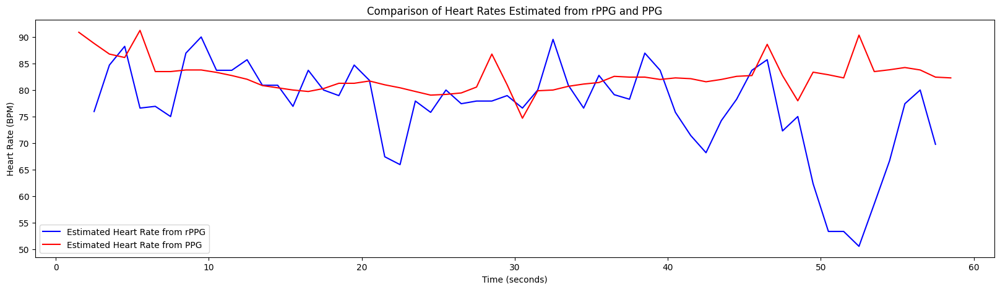

Average Estimated Heart Rate based Video: 76.89
Average Estimated Heart Rate based Pulse: 82.55
MAE: 7.49
RMSE: 11.00
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/23_1.npz...


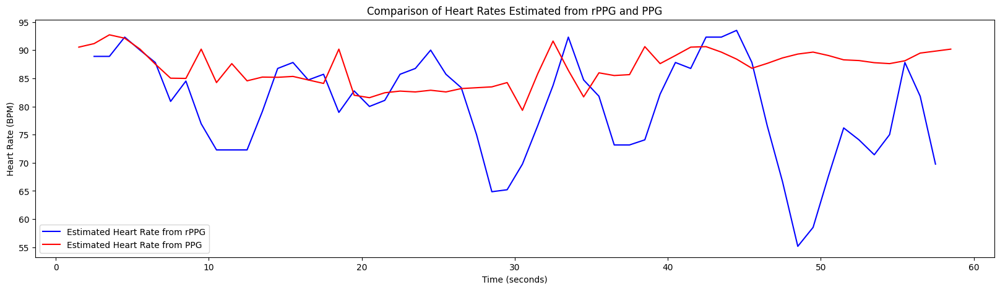

Average Estimated Heart Rate based Video: 80.06
Average Estimated Heart Rate based Pulse: 86.82
MAE: 7.79
RMSE: 11.09
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/23_2.npz...


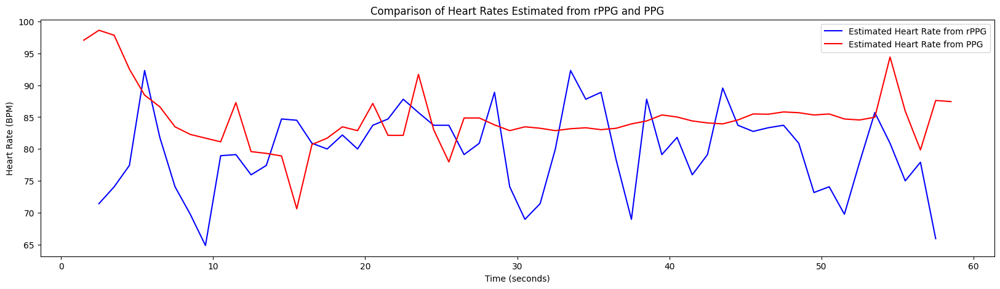

Average Estimated Heart Rate based Video: 79.76
Average Estimated Heart Rate based Pulse: 84.75
MAE: 7.31
RMSE: 9.56
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/23_3.npz...


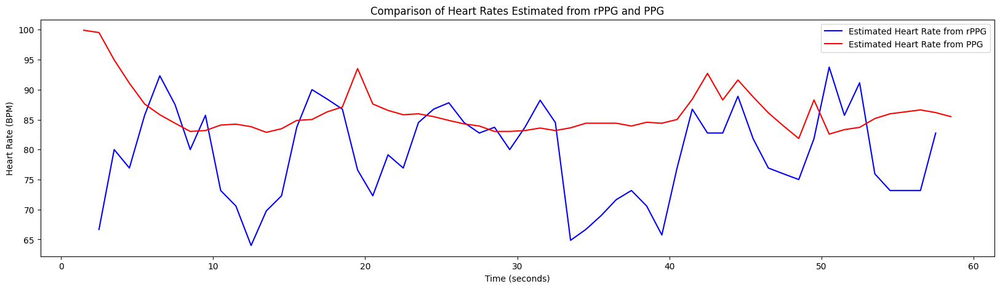

Average Estimated Heart Rate based Video: 79.38
Average Estimated Heart Rate based Pulse: 86.13
MAE: 8.43
RMSE: 10.90
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/24_0.npz...


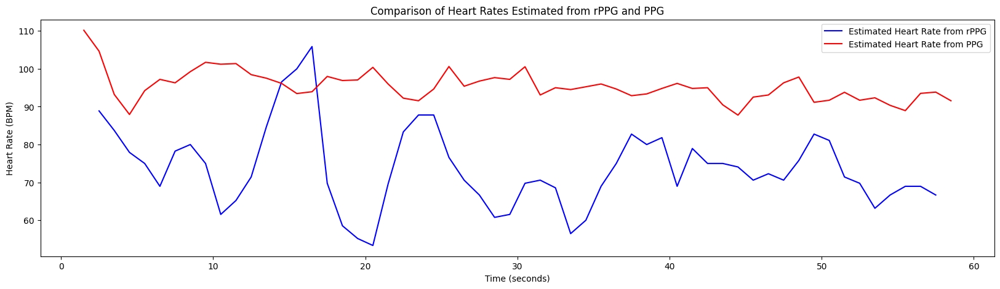

Average Estimated Heart Rate based Video: 73.74
Average Estimated Heart Rate based Pulse: 95.42
MAE: 22.37
RMSE: 24.44
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/24_1.npz...


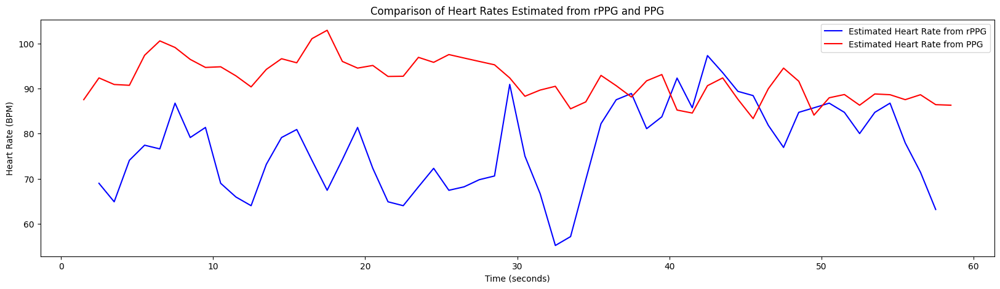

Average Estimated Heart Rate based Video: 76.88
Average Estimated Heart Rate based Pulse: 91.90
MAE: 15.92
RMSE: 18.96
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/24_2.npz...


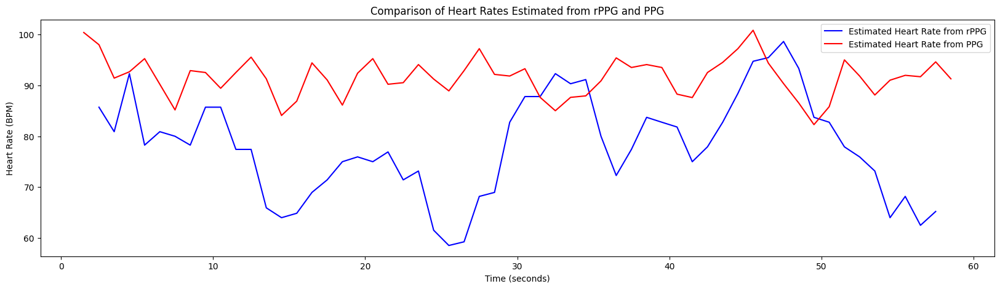

Average Estimated Heart Rate based Video: 78.06
Average Estimated Heart Rate based Pulse: 91.58
MAE: 14.25
RMSE: 16.73
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/24_3.npz...


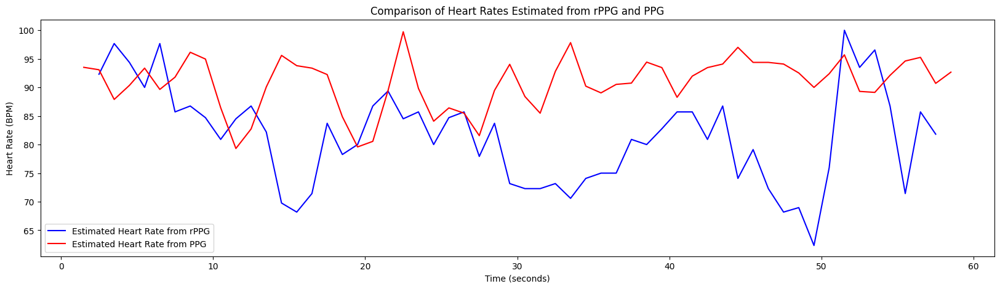

Average Estimated Heart Rate based Video: 81.40
Average Estimated Heart Rate based Pulse: 90.77
MAE: 11.35
RMSE: 13.80
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/25_0.npz...


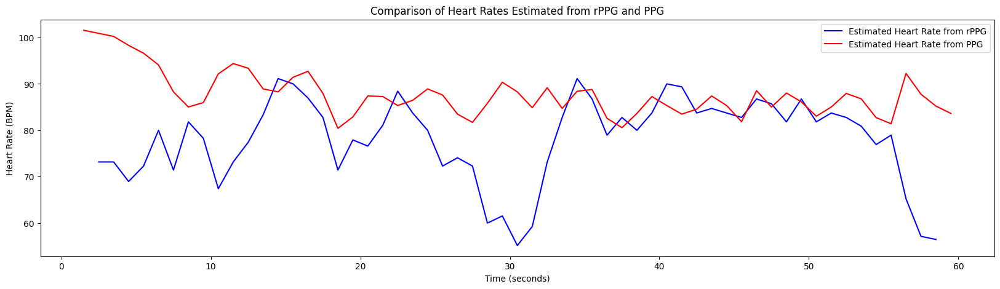

Average Estimated Heart Rate based Video: 77.96
Average Estimated Heart Rate based Pulse: 87.75
MAE: 10.77
RMSE: 14.82
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/25_1.npz...


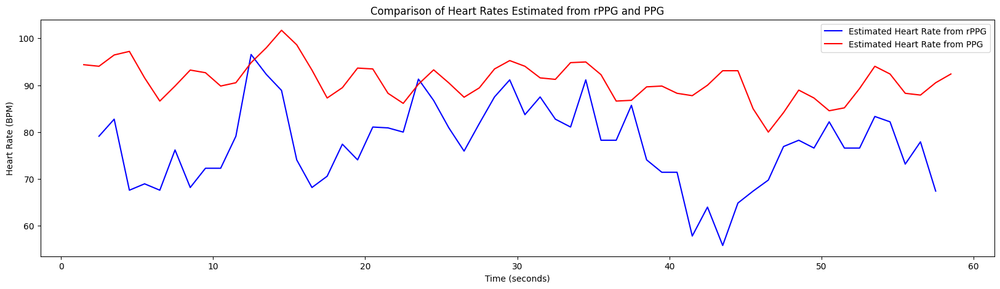

Average Estimated Heart Rate based Video: 77.32
Average Estimated Heart Rate based Pulse: 90.94
MAE: 14.00
RMSE: 16.40
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/25_2.npz...


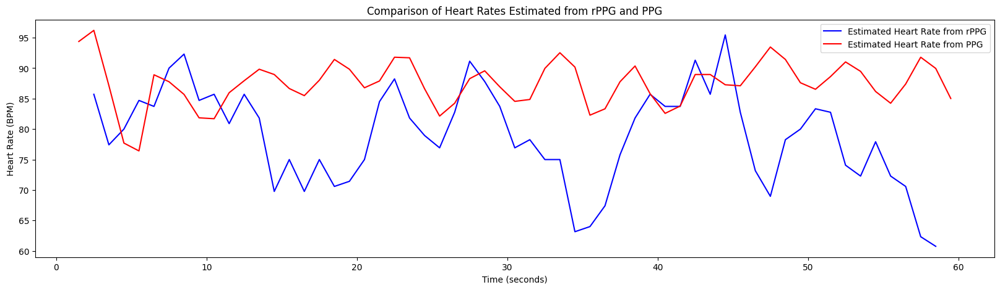

Average Estimated Heart Rate based Video: 78.91
Average Estimated Heart Rate based Pulse: 87.48
MAE: 10.21
RMSE: 12.71
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/25_3.npz...


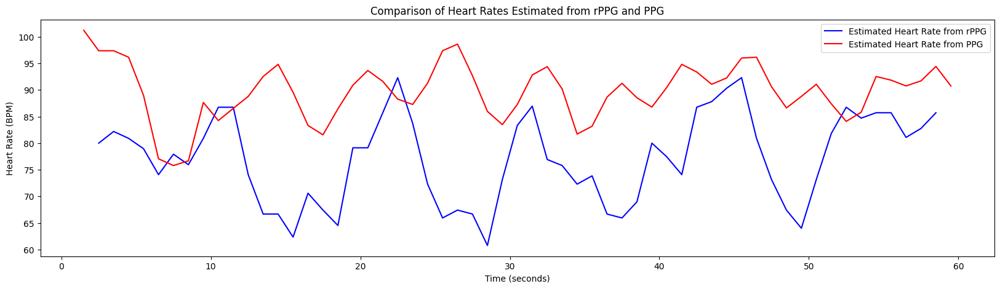

Average Estimated Heart Rate based Video: 77.11
Average Estimated Heart Rate based Pulse: 89.70
MAE: 12.81
RMSE: 15.78
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/26_0.npz...


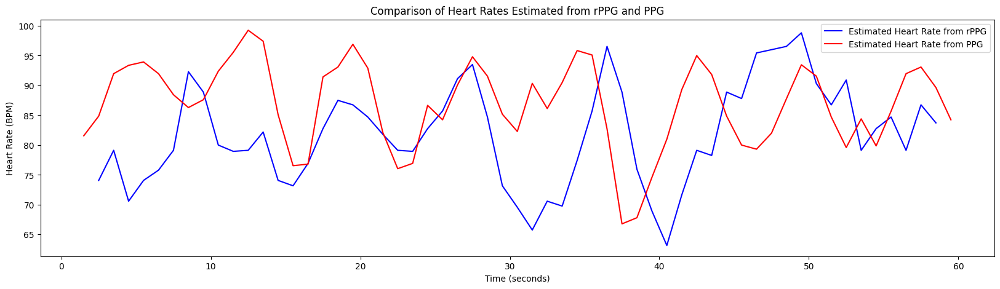

Average Estimated Heart Rate based Video: 81.75
Average Estimated Heart Rate based Pulse: 86.89
MAE: 9.40
RMSE: 11.19
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/26_1.npz...


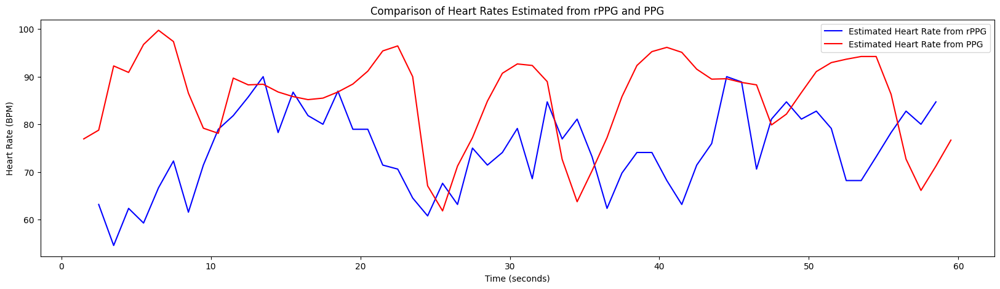

Average Estimated Heart Rate based Video: 74.63
Average Estimated Heart Rate based Pulse: 85.51
MAE: 13.45
RMSE: 16.99
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/26_2.npz...


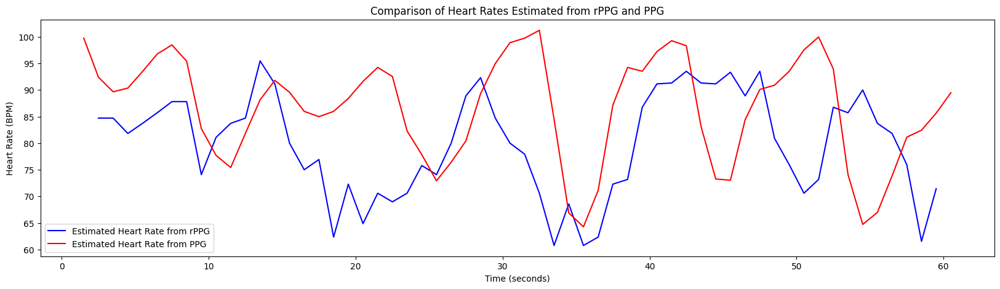

Average Estimated Heart Rate based Video: 79.80
Average Estimated Heart Rate based Pulse: 86.59
MAE: 12.60
RMSE: 14.81
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/26_3.npz...


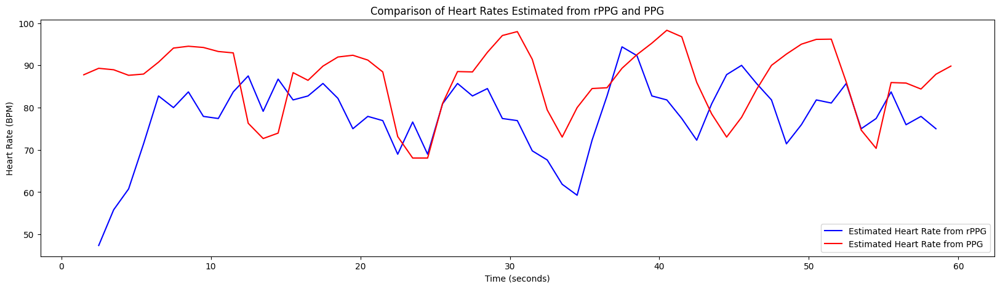

Average Estimated Heart Rate based Video: 77.91
Average Estimated Heart Rate based Pulse: 86.58
MAE: 12.43
RMSE: 14.86
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/27_0.npz...


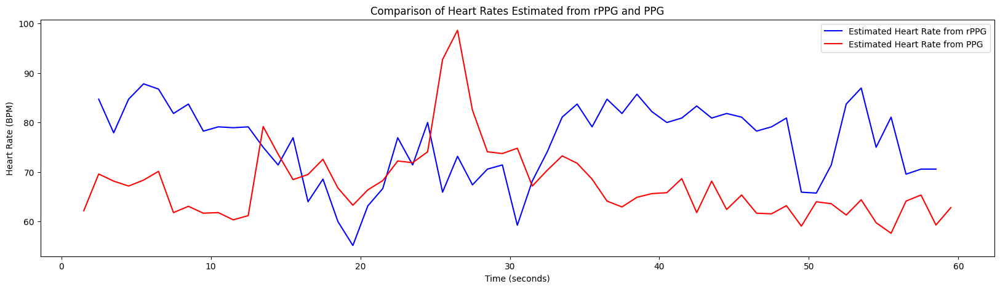

Average Estimated Heart Rate based Video: 75.92
Average Estimated Heart Rate based Pulse: 67.58
MAE: 12.77
RMSE: 14.51
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/27_1.npz...


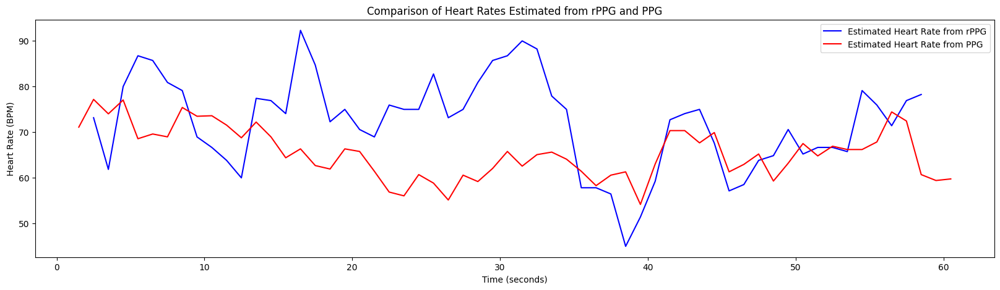

Average Estimated Heart Rate based Video: 72.26
Average Estimated Heart Rate based Pulse: 65.46
MAE: 10.20
RMSE: 12.65
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/27_2.npz...


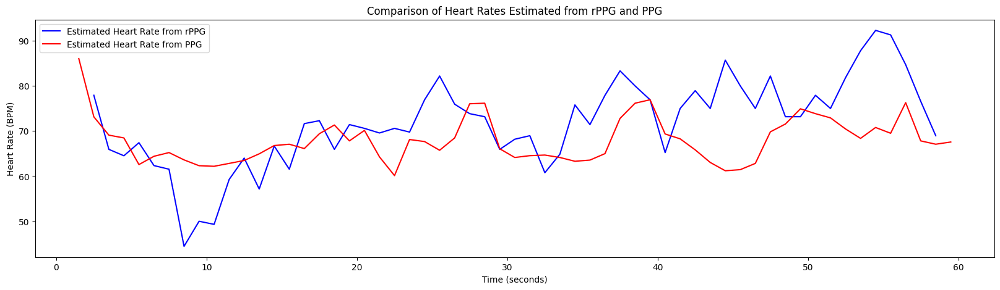

Average Estimated Heart Rate based Video: 71.75
Average Estimated Heart Rate based Pulse: 67.93
MAE: 7.96
RMSE: 10.28
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/27_3.npz...


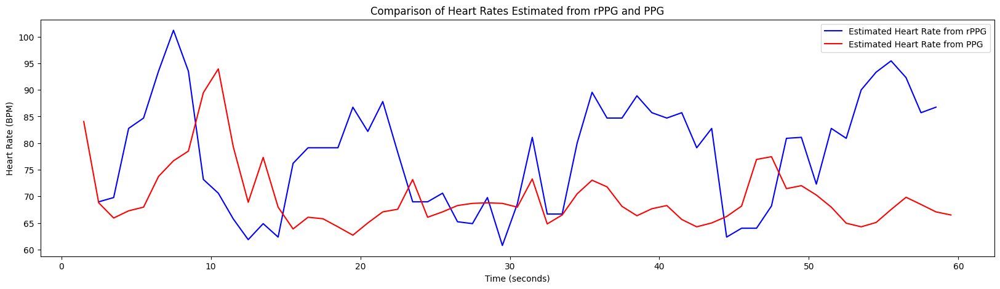

Average Estimated Heart Rate based Video: 77.89
Average Estimated Heart Rate based Pulse: 69.83
MAE: 13.07
RMSE: 15.48
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/28_0.npz...


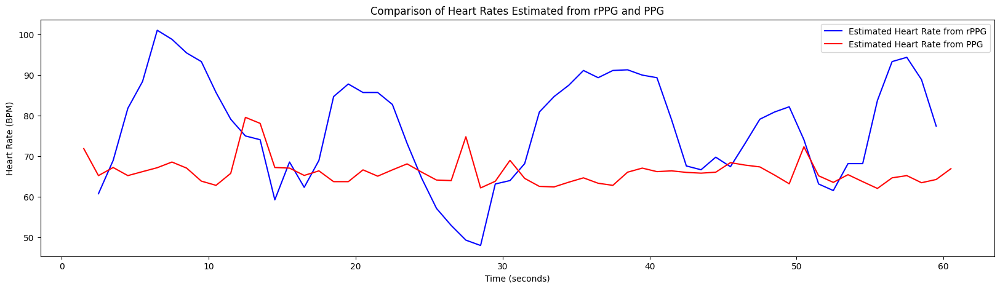

Average Estimated Heart Rate based Video: 76.95
Average Estimated Heart Rate based Pulse: 66.16
MAE: 14.88
RMSE: 17.86
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/28_1.npz...


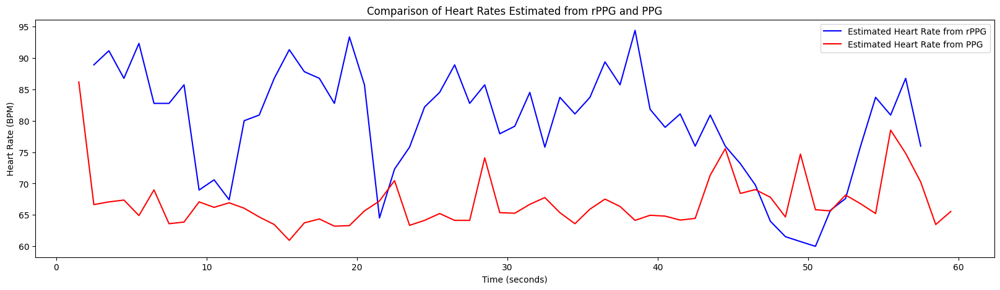

Average Estimated Heart Rate based Video: 79.73
Average Estimated Heart Rate based Pulse: 66.93
MAE: 13.97
RMSE: 16.32
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/28_2.npz...


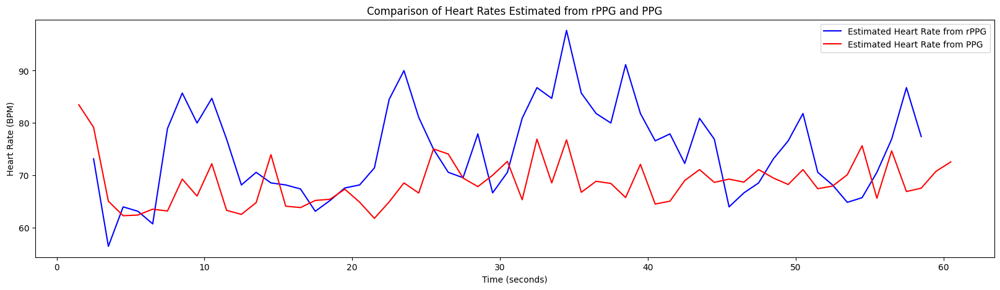

Average Estimated Heart Rate based Video: 74.65
Average Estimated Heart Rate based Pulse: 68.65
MAE: 8.65
RMSE: 11.31
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/28_3.npz...


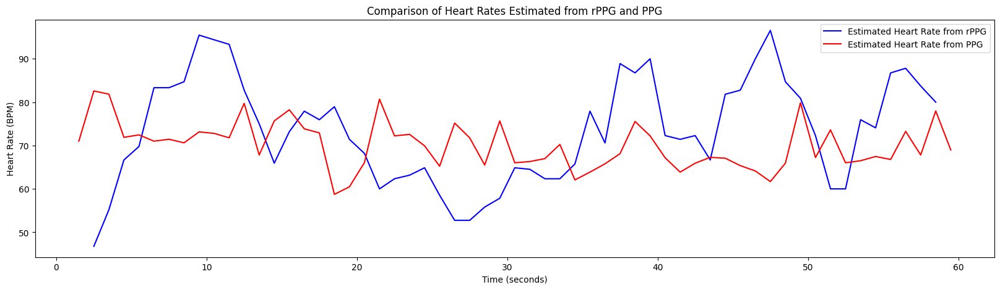

Average Estimated Heart Rate based Video: 73.41
Average Estimated Heart Rate based Pulse: 70.06
MAE: 12.00
RMSE: 14.26
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/29_0.npz...


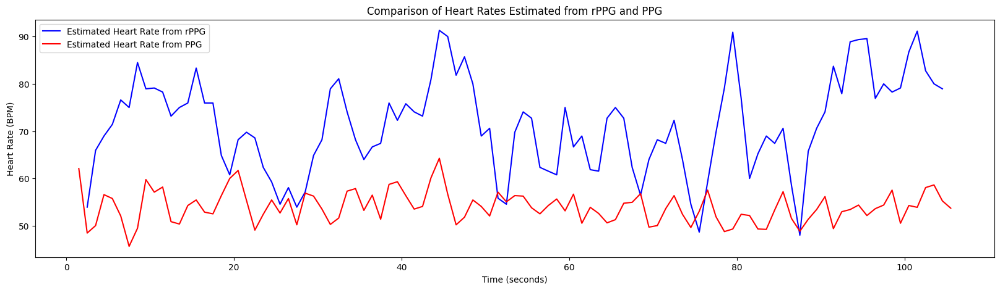

Average Estimated Heart Rate based Video: 71.22
Average Estimated Heart Rate based Pulse: 53.98
MAE: 17.60
RMSE: 20.11
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/29_1.npz...


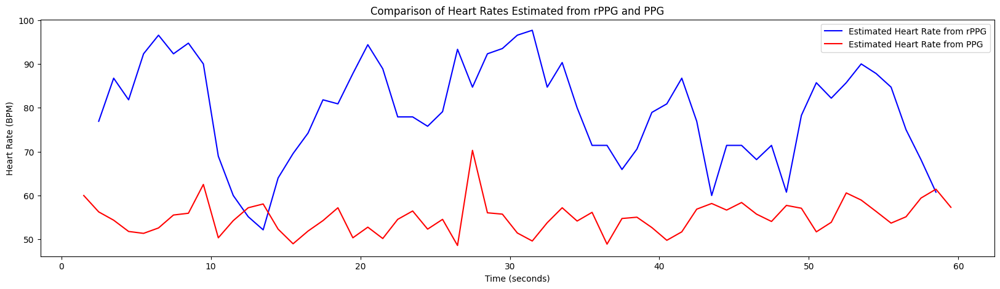

Average Estimated Heart Rate based Video: 79.26
Average Estimated Heart Rate based Pulse: 55.01
MAE: 24.57
RMSE: 27.26
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/29_2.npz...


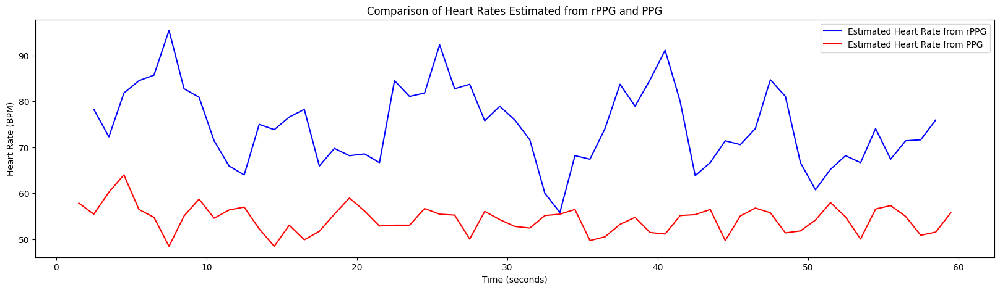

Average Estimated Heart Rate based Video: 74.72
Average Estimated Heart Rate based Pulse: 54.34
MAE: 20.35
RMSE: 22.18
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/29_3.npz...


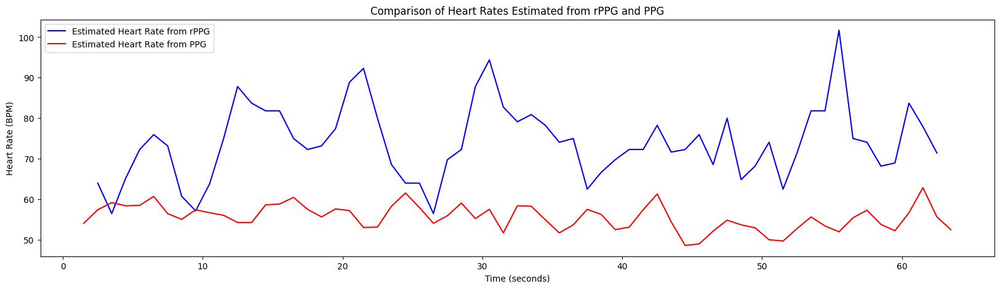

Average Estimated Heart Rate based Video: 74.12
Average Estimated Heart Rate based Pulse: 55.61
MAE: 18.54
RMSE: 20.88
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/2_0.npz...


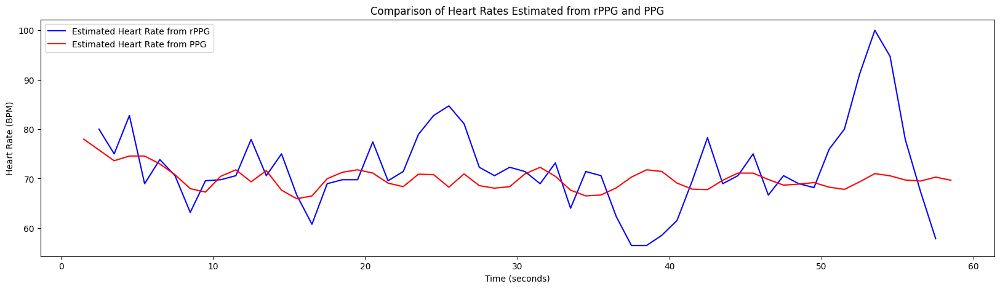

Average Estimated Heart Rate based Video: 72.17
Average Estimated Heart Rate based Pulse: 70.03
MAE: 5.96
RMSE: 8.69
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/2_1.npz...


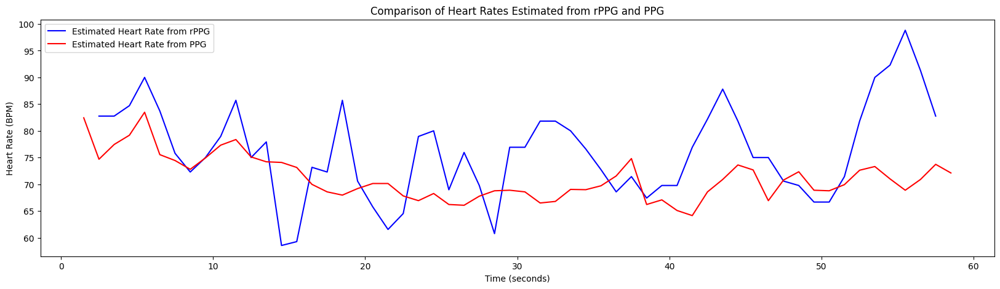

Average Estimated Heart Rate based Video: 76.16
Average Estimated Heart Rate based Pulse: 71.18
MAE: 7.84
RMSE: 10.18
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/2_2.npz...


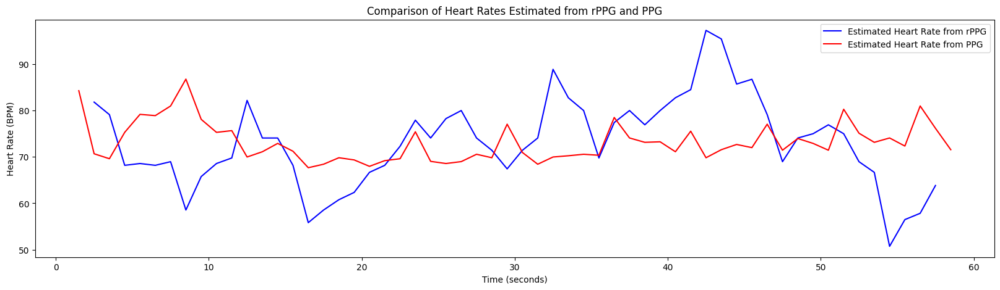

Average Estimated Heart Rate based Video: 73.05
Average Estimated Heart Rate based Pulse: 73.17
MAE: 8.72
RMSE: 10.83
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/2_3.npz...


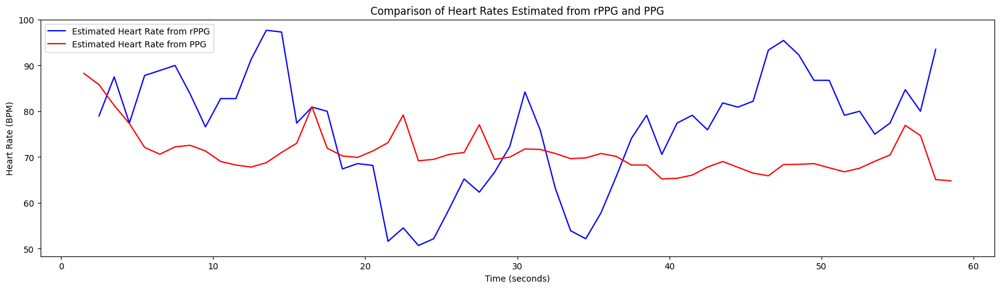

Average Estimated Heart Rate based Video: 76.39
Average Estimated Heart Rate based Pulse: 70.97
MAE: 12.39
RMSE: 14.56
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/30_0.npz...


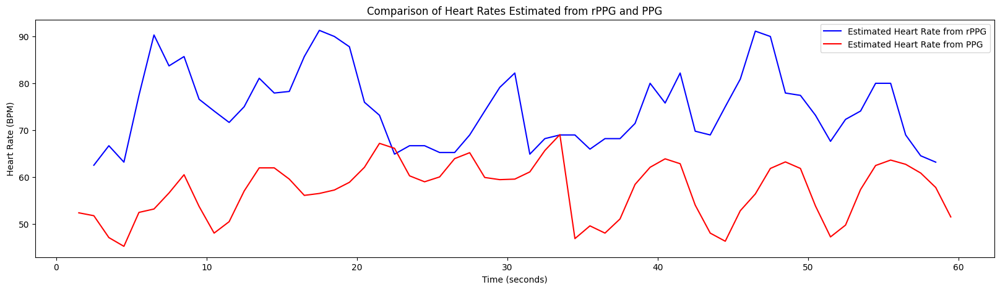

Average Estimated Heart Rate based Video: 74.71
Average Estimated Heart Rate based Pulse: 57.15
MAE: 17.56
RMSE: 20.34
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/30_1.npz...


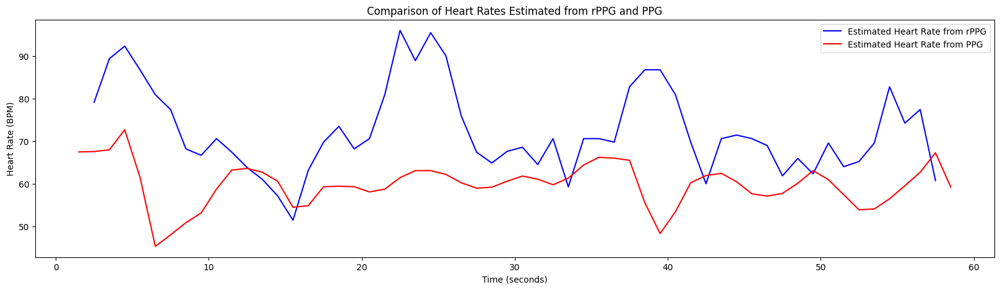

Average Estimated Heart Rate based Video: 72.51
Average Estimated Heart Rate based Pulse: 59.86
MAE: 13.48
RMSE: 16.41
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/30_2.npz...


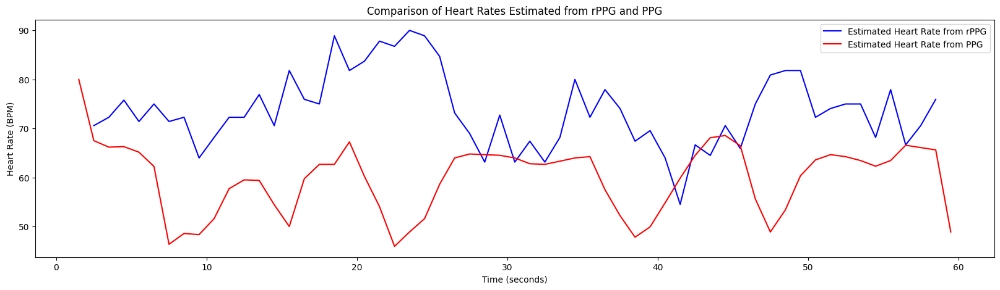

Average Estimated Heart Rate based Video: 73.70
Average Estimated Heart Rate based Pulse: 59.87
MAE: 14.29
RMSE: 17.66
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/30_3.npz...


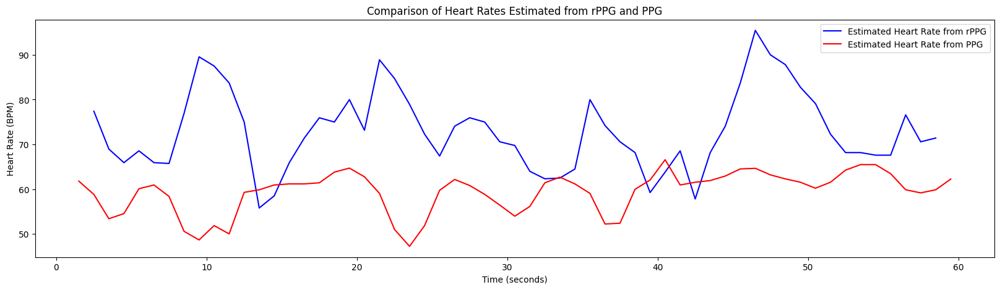

Average Estimated Heart Rate based Video: 72.95
Average Estimated Heart Rate based Pulse: 59.41
MAE: 13.90
RMSE: 16.79
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/31_0.npz...


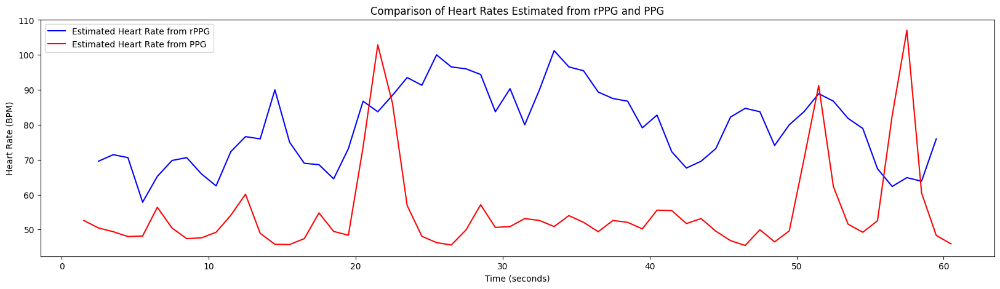

Average Estimated Heart Rate based Video: 79.37
Average Estimated Heart Rate based Pulse: 55.24
MAE: 26.61
RMSE: 29.29
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/31_1.npz...


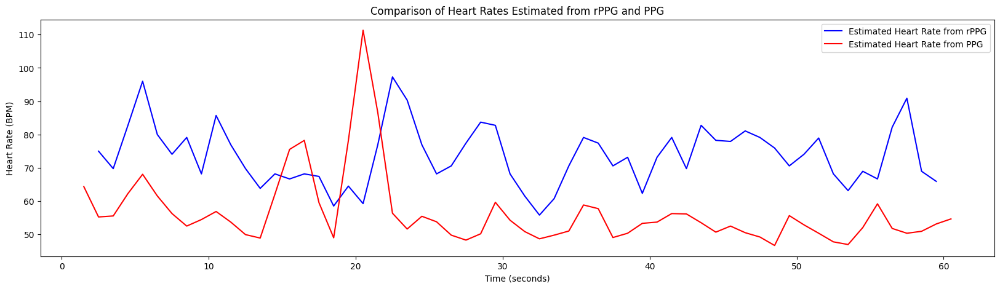

Average Estimated Heart Rate based Video: 73.68
Average Estimated Heart Rate based Pulse: 56.41
MAE: 19.68
RMSE: 21.47
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/31_2.npz...


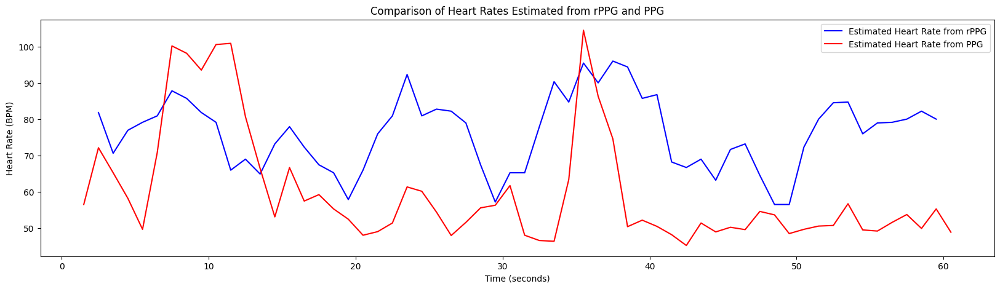

Average Estimated Heart Rate based Video: 76.22
Average Estimated Heart Rate based Pulse: 59.86
MAE: 21.03
RMSE: 23.74
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/31_3.npz...


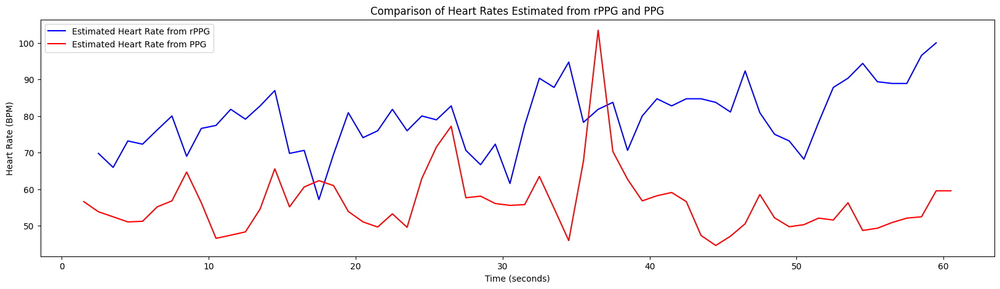

Average Estimated Heart Rate based Video: 79.48
Average Estimated Heart Rate based Pulse: 56.38
MAE: 24.24
RMSE: 26.87
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/32_0.npz...


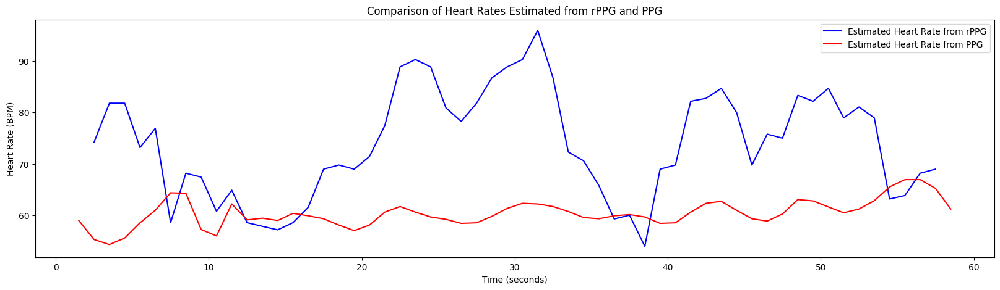

Average Estimated Heart Rate based Video: 73.92
Average Estimated Heart Rate based Pulse: 60.38
MAE: 14.28
RMSE: 17.32
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/32_1.npz...


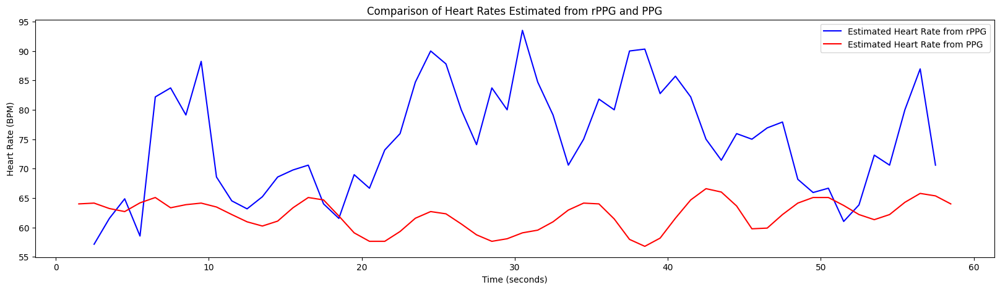

Average Estimated Heart Rate based Video: 74.83
Average Estimated Heart Rate based Pulse: 62.16
MAE: 13.54
RMSE: 16.44
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/32_2.npz...


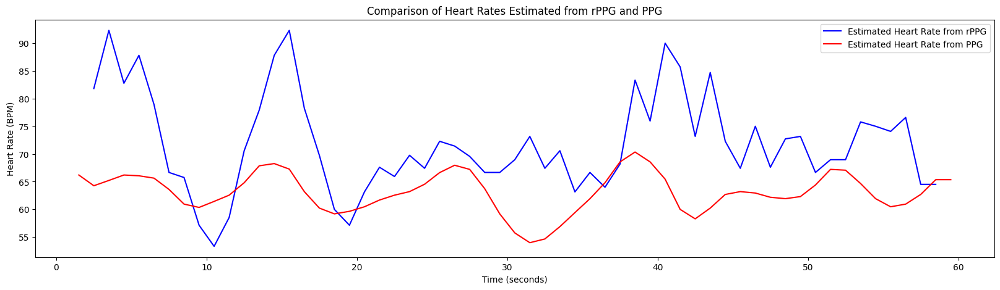

Average Estimated Heart Rate based Video: 71.89
Average Estimated Heart Rate based Pulse: 63.13
MAE: 9.42
RMSE: 11.71
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/32_3.npz...


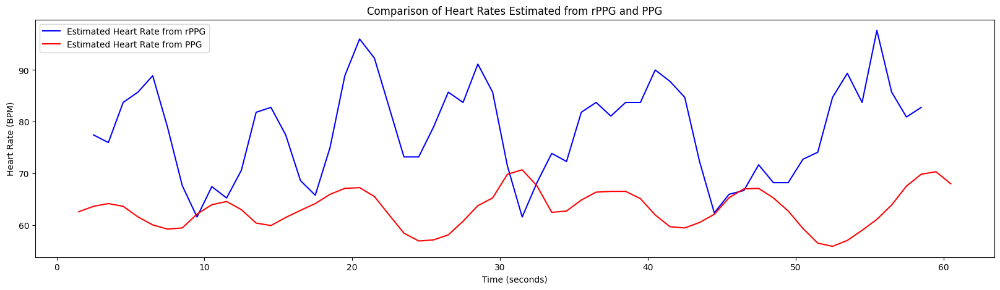

Average Estimated Heart Rate based Video: 78.19
Average Estimated Heart Rate based Pulse: 63.09
MAE: 15.81
RMSE: 18.42
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/33_0.npz...


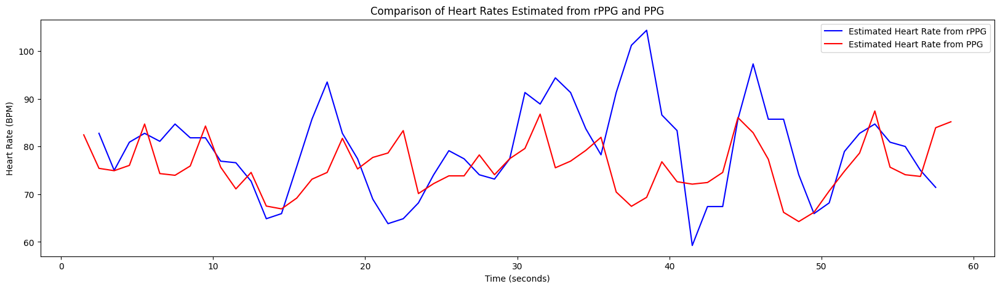

Average Estimated Heart Rate based Video: 79.45
Average Estimated Heart Rate based Pulse: 75.76
MAE: 8.08
RMSE: 10.60
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/33_1.npz...


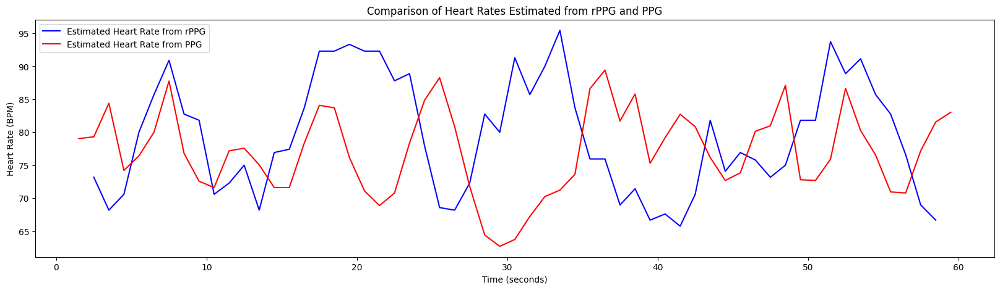

Average Estimated Heart Rate based Video: 79.48
Average Estimated Heart Rate based Pulse: 77.06
MAE: 10.37
RMSE: 12.46
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/33_2.npz...


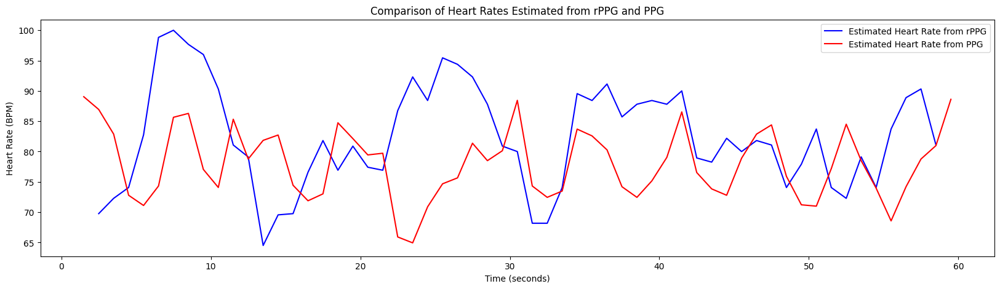

Average Estimated Heart Rate based Video: 82.38
Average Estimated Heart Rate based Pulse: 78.00
MAE: 10.25
RMSE: 12.47
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/33_3.npz...


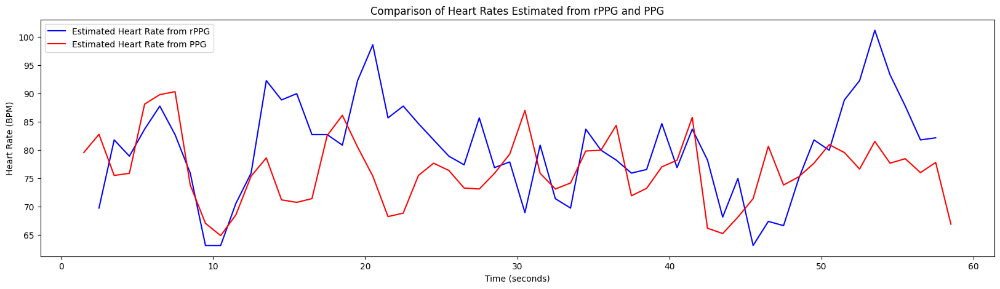

Average Estimated Heart Rate based Video: 80.23
Average Estimated Heart Rate based Pulse: 76.42
MAE: 7.74
RMSE: 9.51
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/34_0.npz...


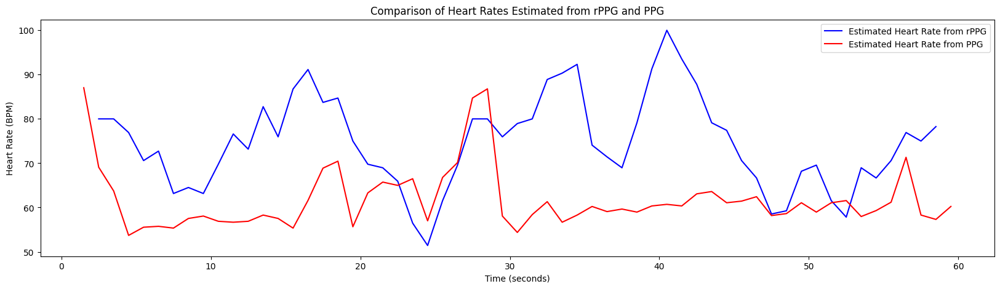

Average Estimated Heart Rate based Video: 74.60
Average Estimated Heart Rate based Pulse: 61.75
MAE: 14.61
RMSE: 17.61
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/34_1.npz...


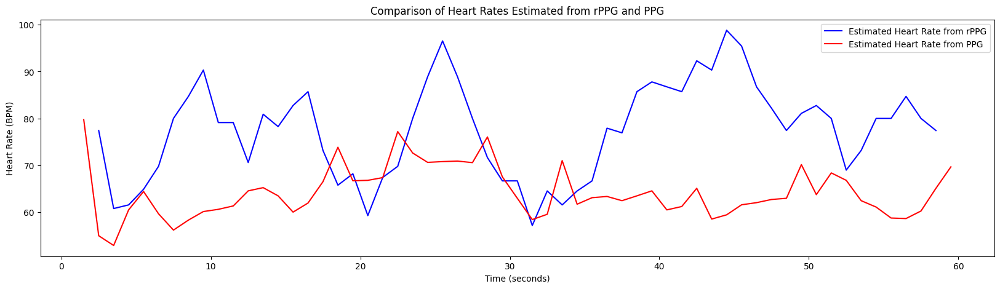

Average Estimated Heart Rate based Video: 77.46
Average Estimated Heart Rate based Pulse: 64.24
MAE: 14.68
RMSE: 17.69
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/34_2.npz...


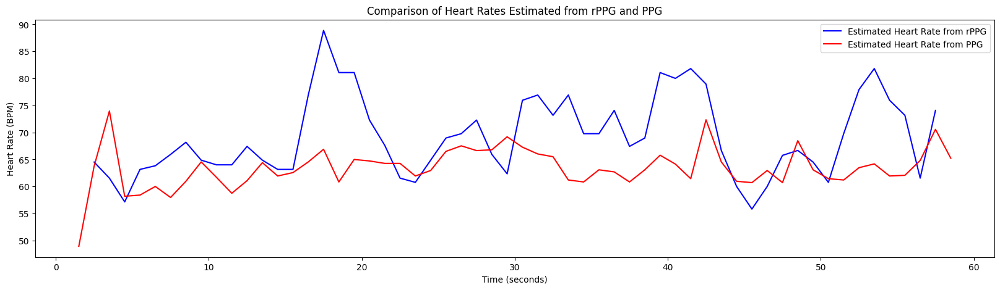

Average Estimated Heart Rate based Video: 69.27
Average Estimated Heart Rate based Pulse: 63.44
MAE: 7.96
RMSE: 9.85
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/34_3.npz...


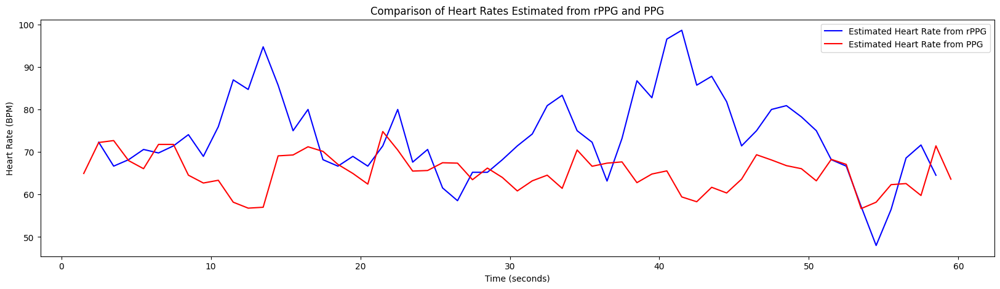

Average Estimated Heart Rate based Video: 73.67
Average Estimated Heart Rate based Pulse: 65.27
MAE: 10.59
RMSE: 14.10
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/35_0.npz...


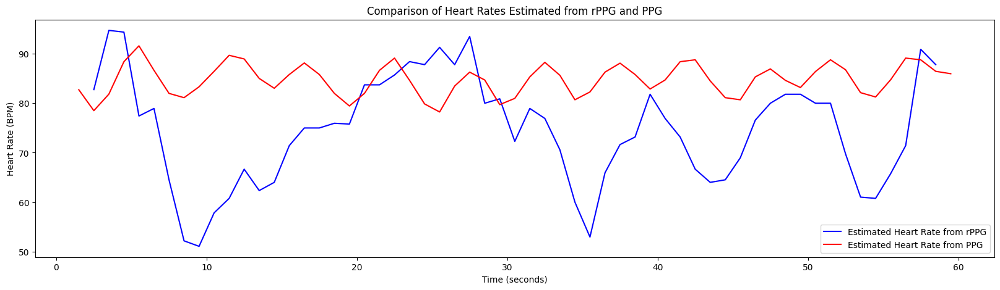

Average Estimated Heart Rate based Video: 74.56
Average Estimated Heart Rate based Pulse: 84.75
MAE: 12.63
RMSE: 15.32
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/35_1.npz...


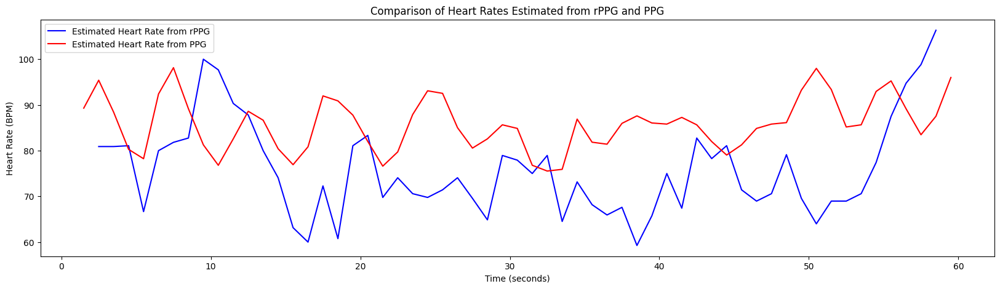

Average Estimated Heart Rate based Video: 75.89
Average Estimated Heart Rate based Pulse: 85.80
MAE: 12.60
RMSE: 14.56
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/35_2.npz...


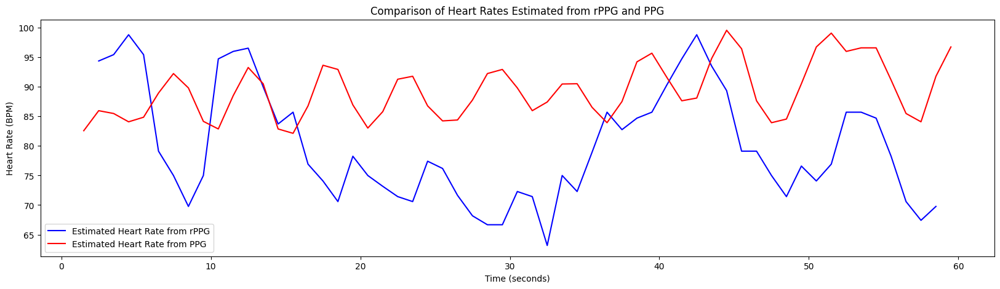

Average Estimated Heart Rate based Video: 79.99
Average Estimated Heart Rate based Pulse: 89.33
MAE: 12.68
RMSE: 14.05
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/35_3.npz...


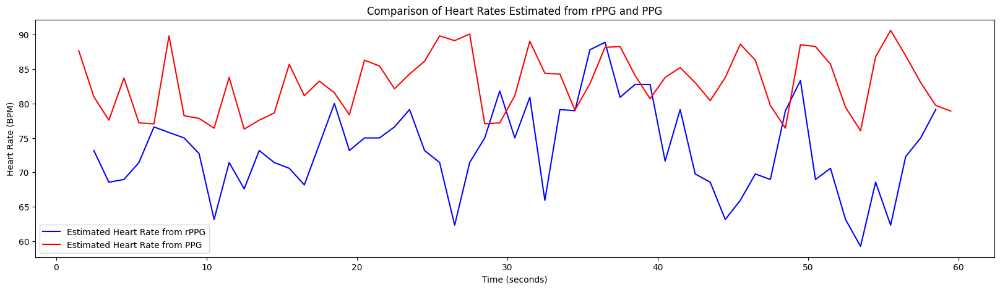

Average Estimated Heart Rate based Video: 73.29
Average Estimated Heart Rate based Pulse: 82.94
MAE: 10.71
RMSE: 12.70
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/36_0.npz...


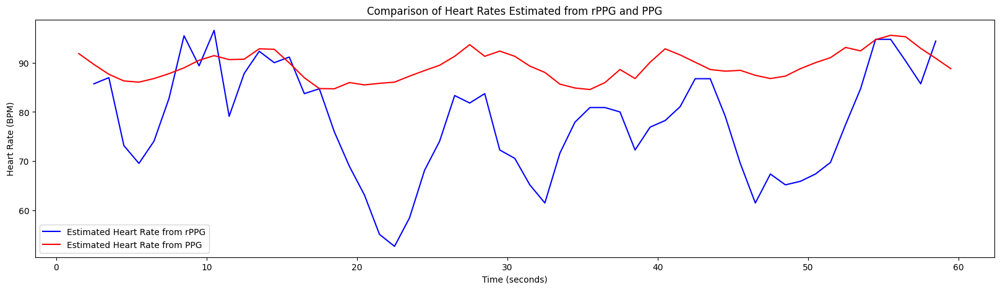

Average Estimated Heart Rate based Video: 77.88
Average Estimated Heart Rate based Pulse: 89.27
MAE: 12.06
RMSE: 14.81
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/36_1.npz...


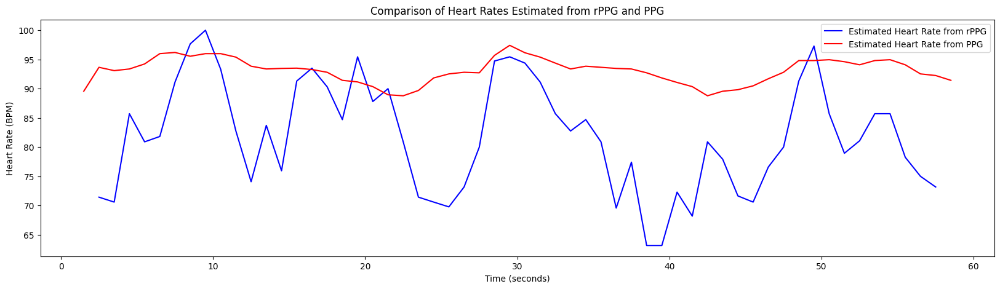

Average Estimated Heart Rate based Video: 81.81
Average Estimated Heart Rate based Pulse: 93.09
MAE: 11.83
RMSE: 14.11
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/36_2.npz...


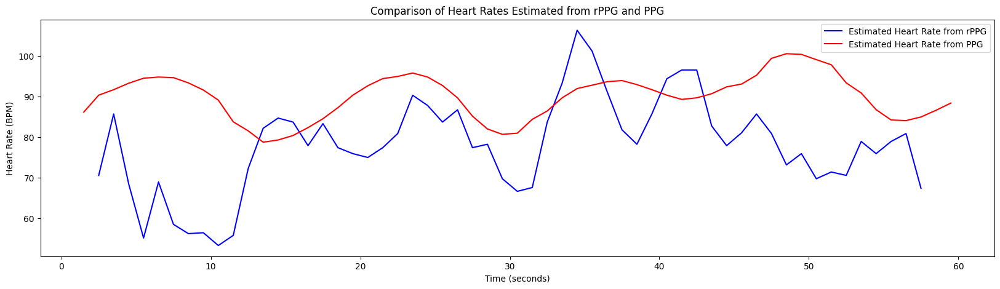

Average Estimated Heart Rate based Video: 78.02
Average Estimated Heart Rate based Pulse: 89.95
MAE: 14.28
RMSE: 17.78
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/36_3.npz...


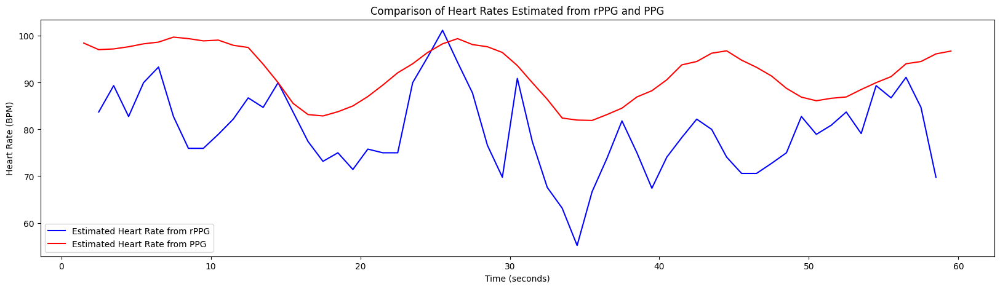

Average Estimated Heart Rate based Video: 79.68
Average Estimated Heart Rate based Pulse: 92.06
MAE: 12.47
RMSE: 14.59
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/37_0.npz...


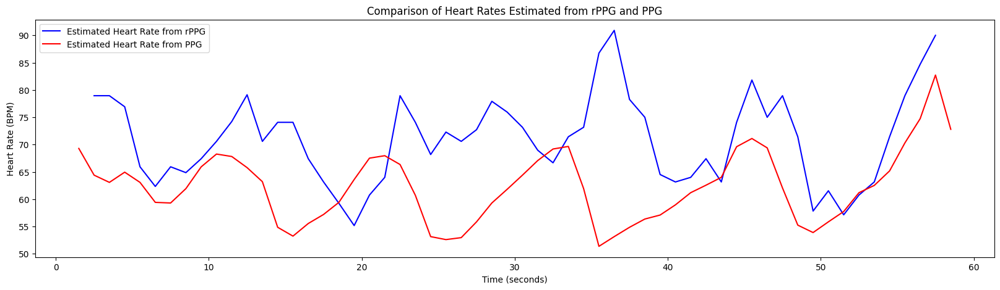

Average Estimated Heart Rate based Video: 71.03
Average Estimated Heart Rate based Pulse: 62.32
MAE: 9.68
RMSE: 12.29
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/37_1.npz...


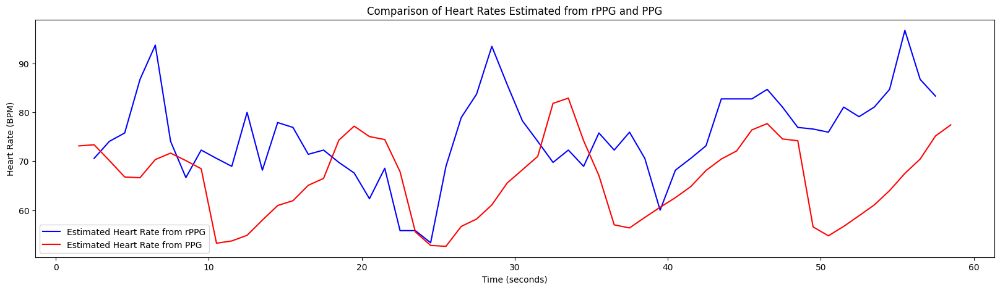

Average Estimated Heart Rate based Video: 75.19
Average Estimated Heart Rate based Pulse: 66.16
MAE: 12.72
RMSE: 15.56
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/37_2.npz...


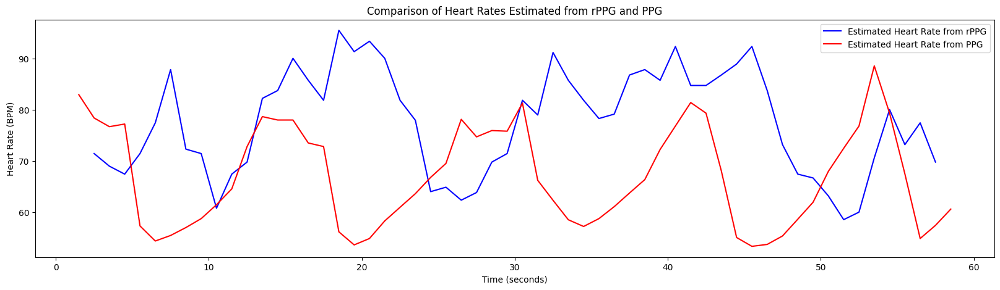

Average Estimated Heart Rate based Video: 77.61
Average Estimated Heart Rate based Pulse: 66.94
MAE: 14.45
RMSE: 17.59
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/37_3.npz...


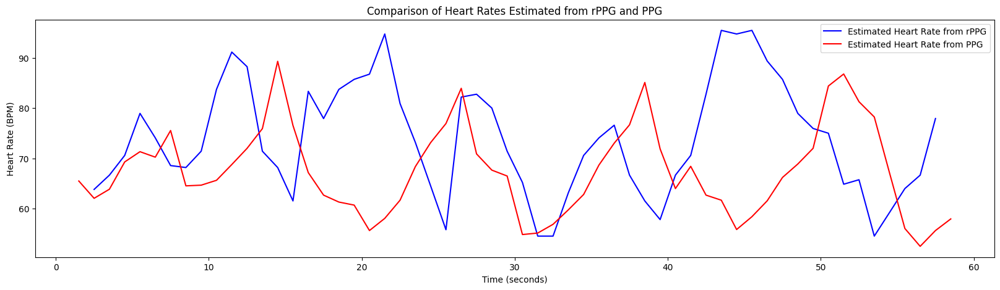

Average Estimated Heart Rate based Video: 73.89
Average Estimated Heart Rate based Pulse: 67.49
MAE: 13.68
RMSE: 17.32
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/38_0.npz...


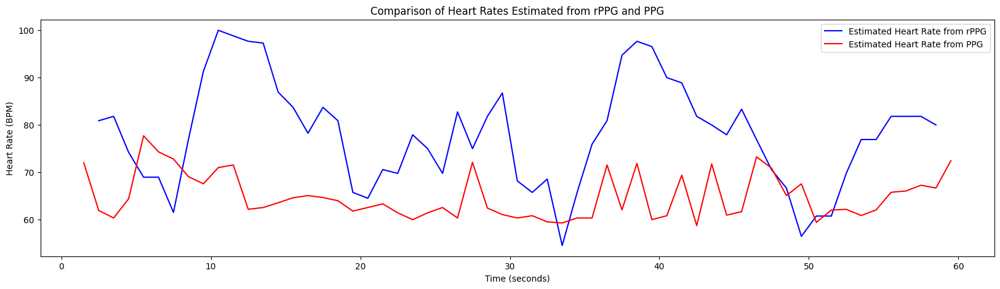

Average Estimated Heart Rate based Video: 77.96
Average Estimated Heart Rate based Pulse: 64.91
MAE: 14.92
RMSE: 17.30
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/38_1.npz...


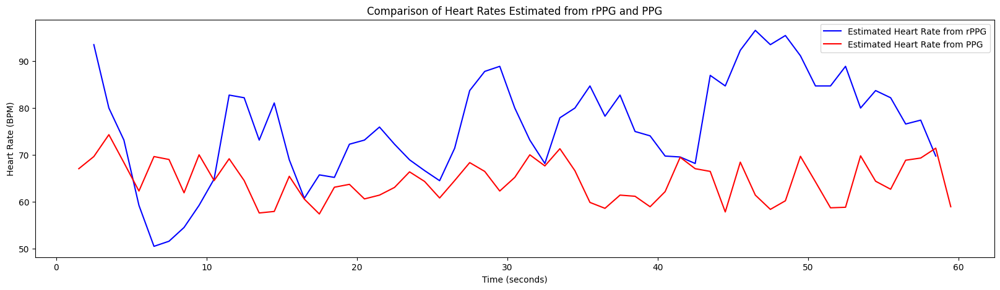

Average Estimated Heart Rate based Video: 76.18
Average Estimated Heart Rate based Pulse: 64.49
MAE: 14.19
RMSE: 16.77
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/38_2.npz...


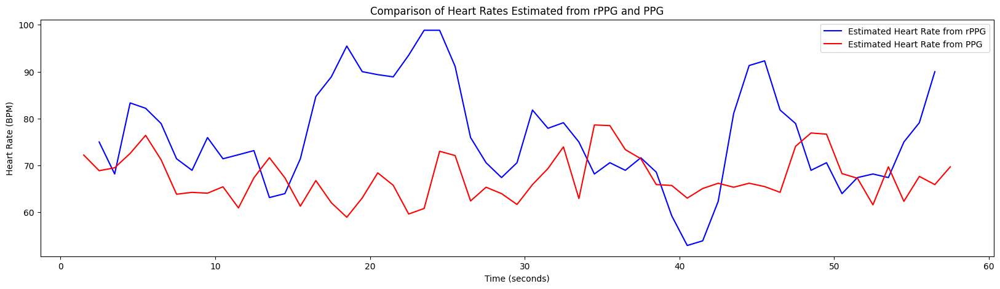

Average Estimated Heart Rate based Video: 76.18
Average Estimated Heart Rate based Pulse: 67.42
MAE: 12.09
RMSE: 15.67
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/38_3.npz...


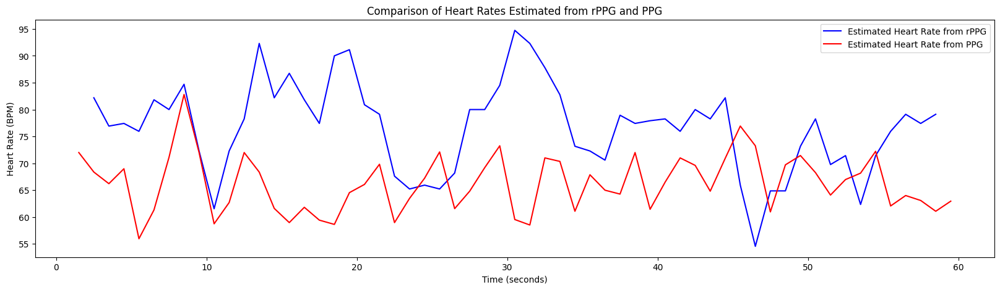

Average Estimated Heart Rate based Video: 76.71
Average Estimated Heart Rate based Pulse: 66.29
MAE: 12.71
RMSE: 15.05
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/39_0.npz...


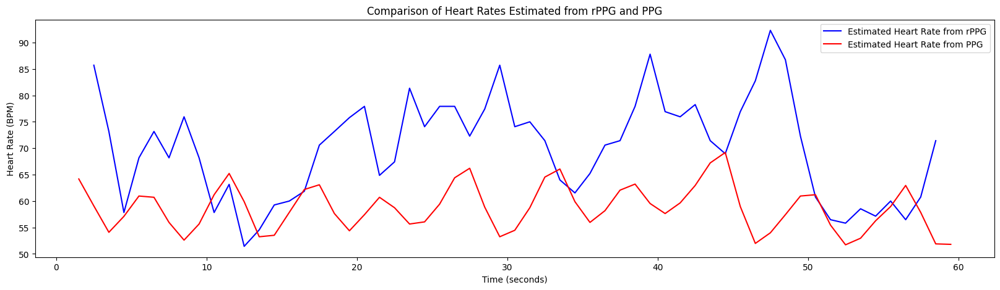

Average Estimated Heart Rate based Video: 70.07
Average Estimated Heart Rate based Pulse: 58.69
MAE: 12.32
RMSE: 15.06
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/39_1.npz...


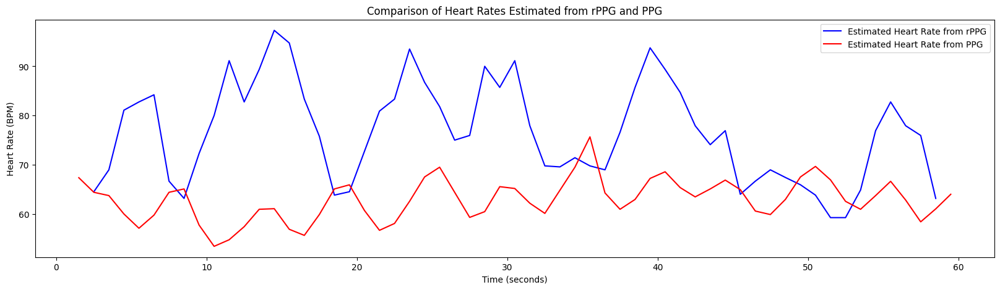

Average Estimated Heart Rate based Video: 76.61
Average Estimated Heart Rate based Pulse: 62.89
MAE: 14.97
RMSE: 18.32
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/39_2.npz...


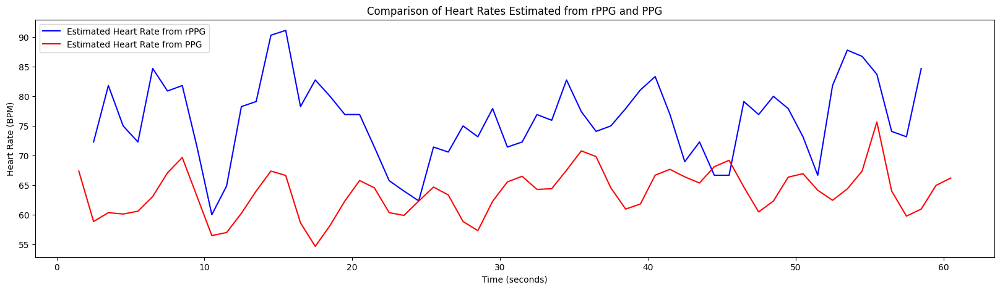

Average Estimated Heart Rate based Video: 76.07
Average Estimated Heart Rate based Pulse: 63.75
MAE: 12.56
RMSE: 14.77
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/39_3.npz...


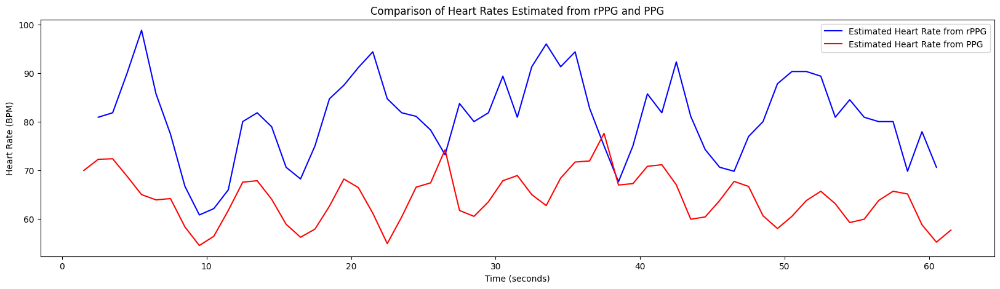

Average Estimated Heart Rate based Video: 80.77
Average Estimated Heart Rate based Pulse: 64.23
MAE: 16.61
RMSE: 18.45
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/3_0.npz...


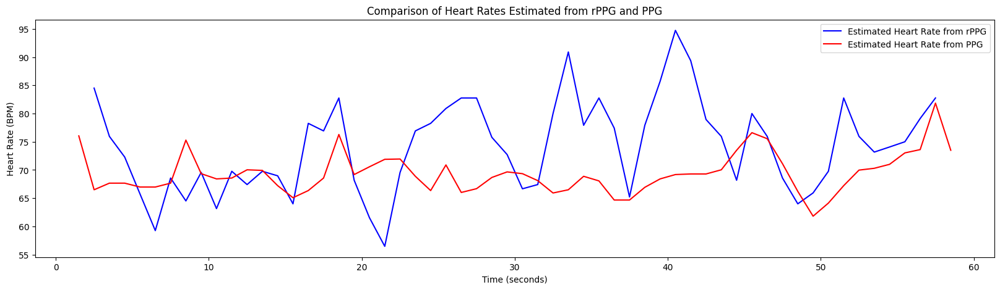

Average Estimated Heart Rate based Video: 74.17
Average Estimated Heart Rate based Pulse: 69.38
MAE: 8.09
RMSE: 10.13
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/3_1.npz...


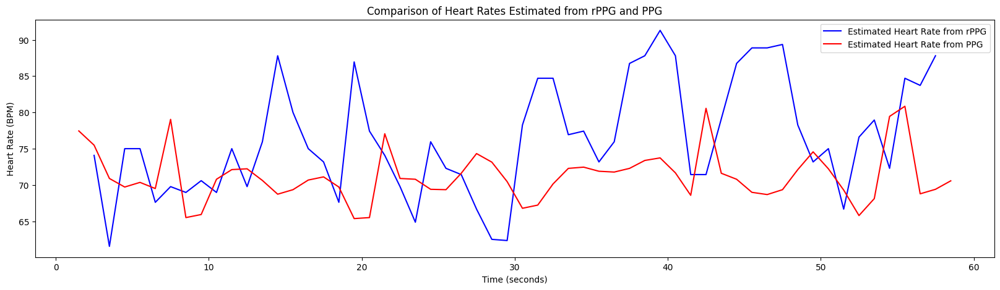

Average Estimated Heart Rate based Video: 76.39
Average Estimated Heart Rate based Pulse: 71.21
MAE: 8.14
RMSE: 10.12
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/3_2.npz...


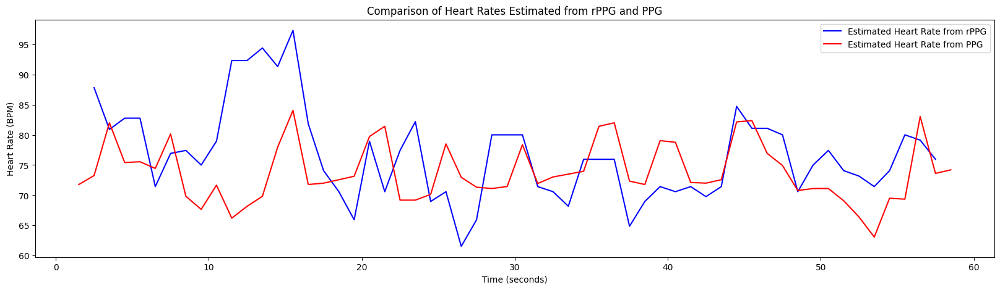

Average Estimated Heart Rate based Video: 76.68
Average Estimated Heart Rate based Pulse: 73.84
MAE: 7.36
RMSE: 9.75
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/3_3.npz...


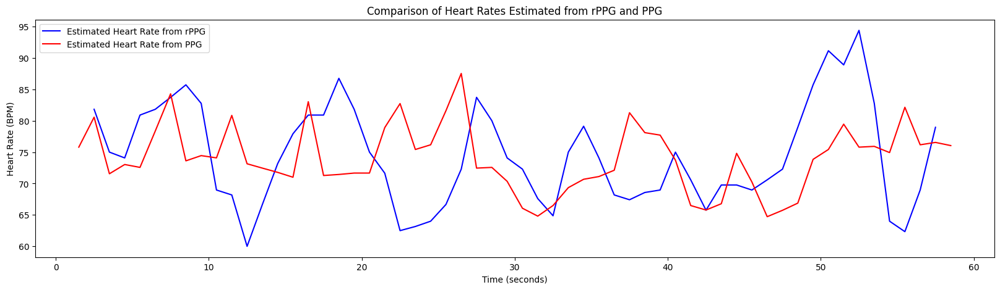

Average Estimated Heart Rate based Video: 74.45
Average Estimated Heart Rate based Pulse: 74.02
MAE: 7.50
RMSE: 9.23
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/40_0.npz...


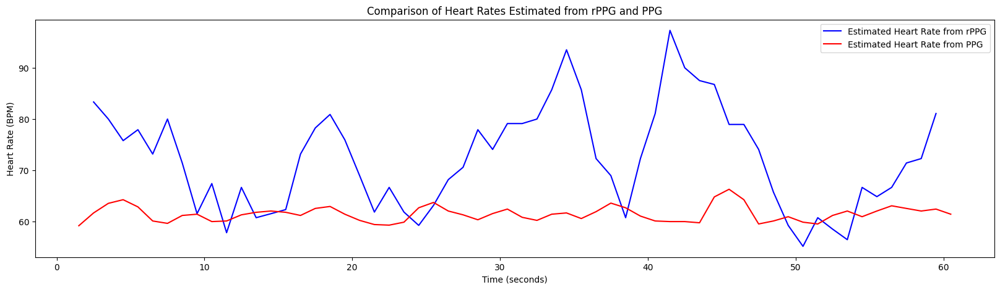

Average Estimated Heart Rate based Video: 72.27
Average Estimated Heart Rate based Pulse: 61.49
MAE: 11.44
RMSE: 14.61
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/40_1.npz...


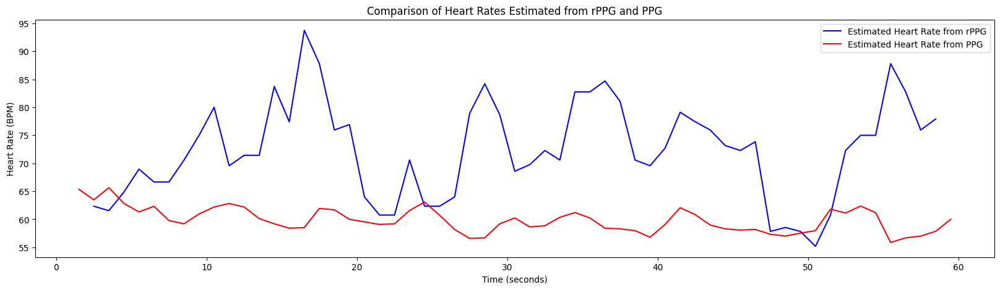

Average Estimated Heart Rate based Video: 72.37
Average Estimated Heart Rate based Pulse: 59.86
MAE: 12.80
RMSE: 15.48
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/40_2.npz...


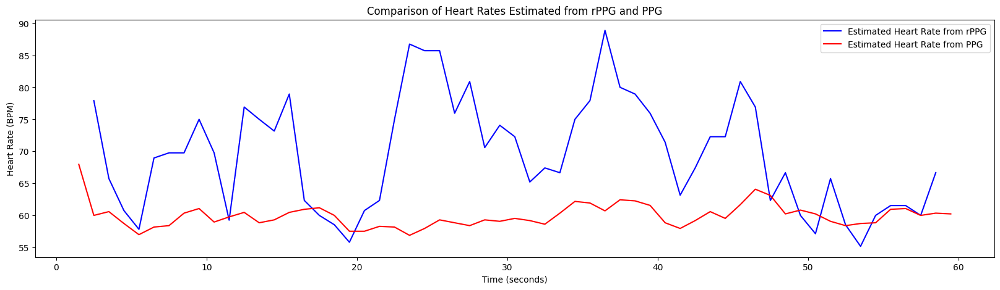

Average Estimated Heart Rate based Video: 69.50
Average Estimated Heart Rate based Pulse: 59.94
MAE: 10.25
RMSE: 12.91
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/40_3.npz...


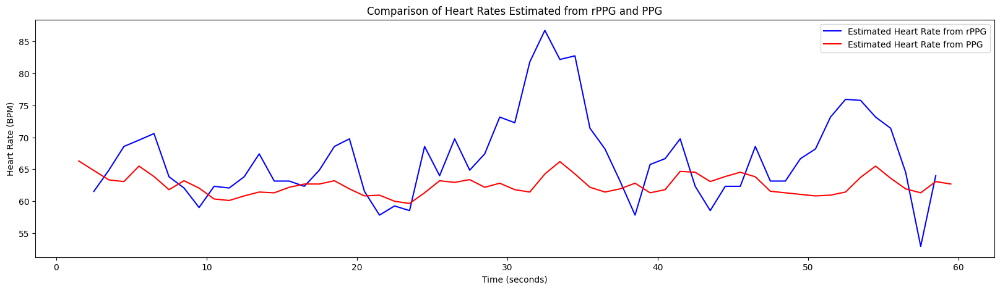

Average Estimated Heart Rate based Video: 66.80
Average Estimated Heart Rate based Pulse: 62.56
MAE: 5.65
RMSE: 7.77
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/4_0.npz...


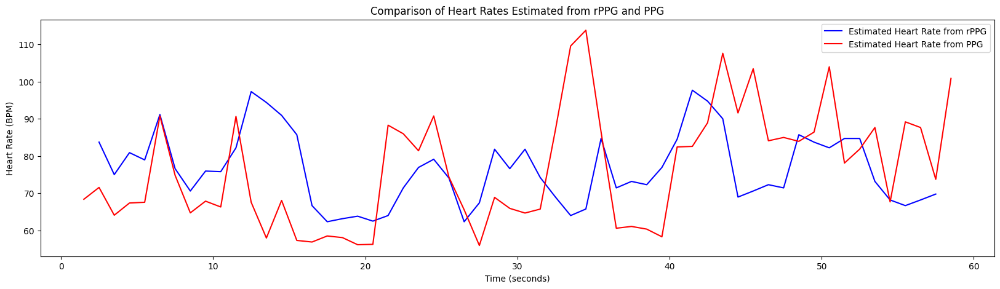

Average Estimated Heart Rate based Video: 76.46
Average Estimated Heart Rate based Pulse: 76.59
MAE: 13.87
RMSE: 16.93
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/4_1.npz...


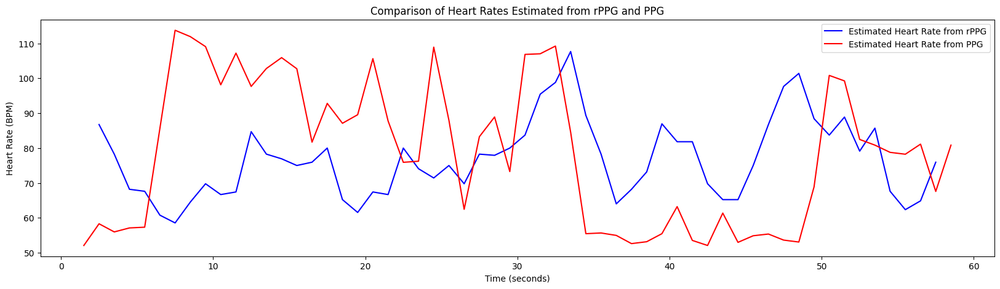

Average Estimated Heart Rate based Video: 76.67
Average Estimated Heart Rate based Pulse: 78.81
MAE: 19.68
RMSE: 23.36
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/4_2.npz...


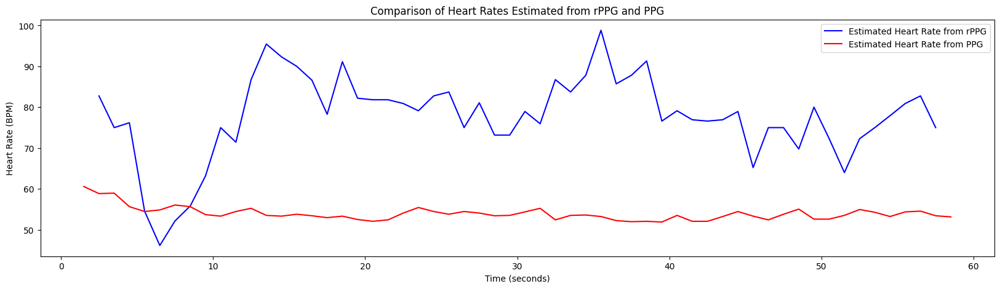

Average Estimated Heart Rate based Video: 77.76
Average Estimated Heart Rate based Pulse: 53.96
MAE: 24.21
RMSE: 26.01
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/4_3.npz...


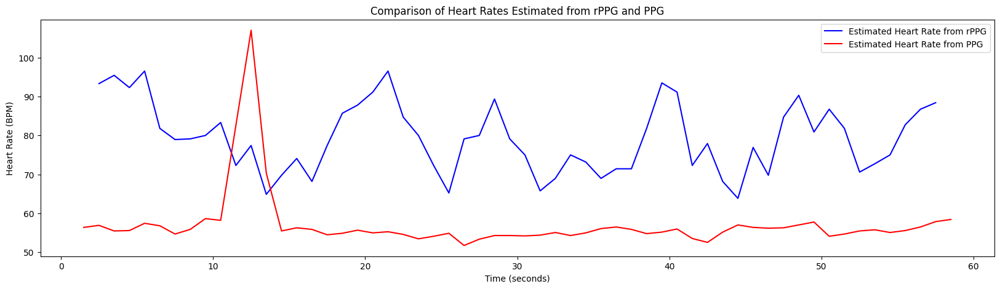

Average Estimated Heart Rate based Video: 79.32
Average Estimated Heart Rate based Pulse: 57.09
MAE: 23.98
RMSE: 25.82
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/5_0.npz...


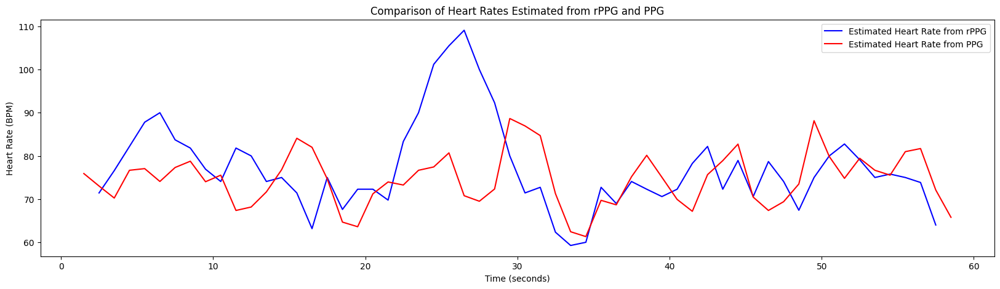

Average Estimated Heart Rate based Video: 77.29
Average Estimated Heart Rate based Pulse: 74.58
MAE: 9.24
RMSE: 11.95
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/5_1.npz...


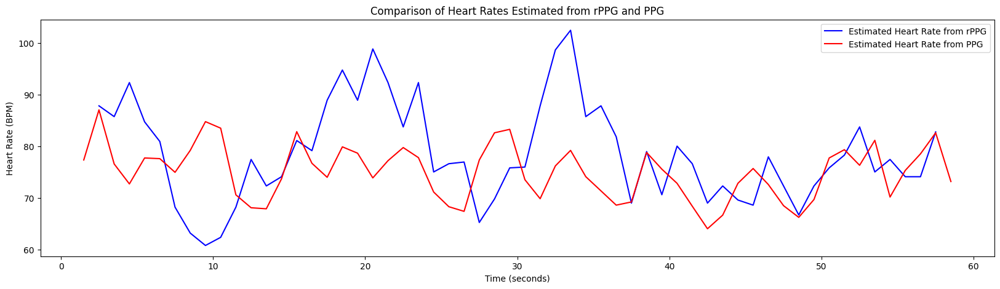

Average Estimated Heart Rate based Video: 78.61
Average Estimated Heart Rate based Pulse: 74.98
MAE: 8.35
RMSE: 10.68
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/5_2.npz...


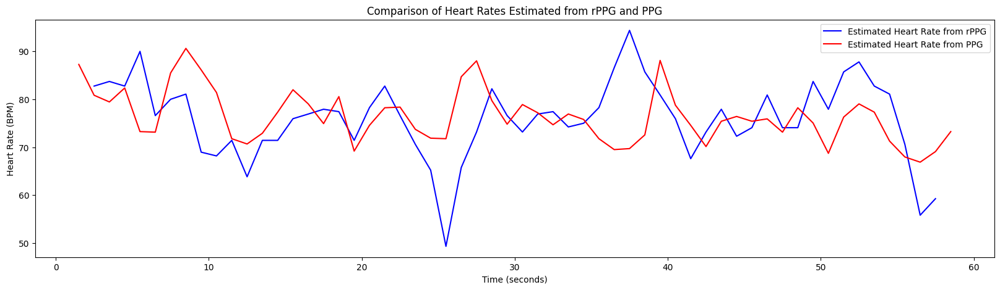

Average Estimated Heart Rate based Video: 75.89
Average Estimated Heart Rate based Pulse: 76.42
MAE: 6.78
RMSE: 8.98
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/5_3.npz...


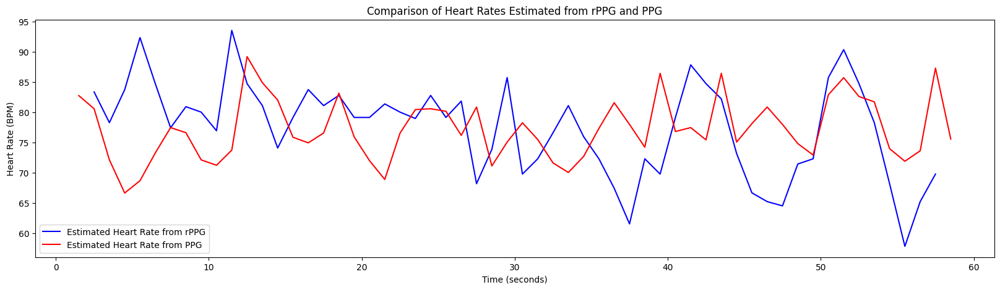

Average Estimated Heart Rate based Video: 77.39
Average Estimated Heart Rate based Pulse: 77.17
MAE: 7.83
RMSE: 9.57
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/6_0.npz...


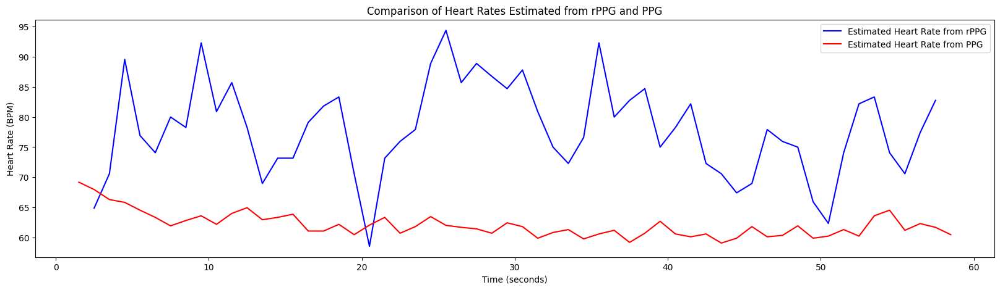

Average Estimated Heart Rate based Video: 77.95
Average Estimated Heart Rate based Pulse: 62.06
MAE: 16.08
RMSE: 17.77
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/6_1.npz...


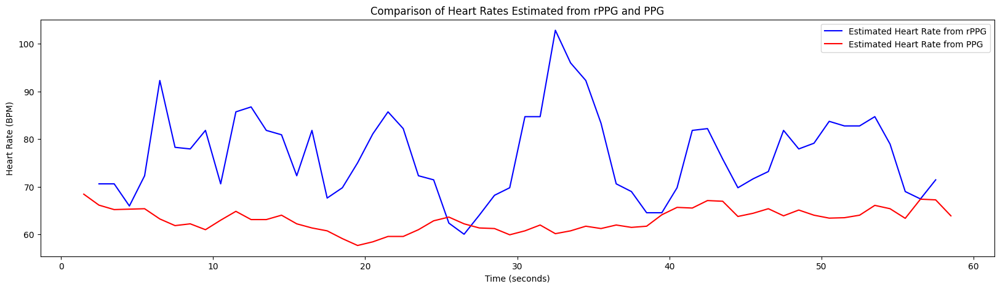

Average Estimated Heart Rate based Video: 76.70
Average Estimated Heart Rate based Pulse: 63.07
MAE: 13.87
RMSE: 16.63
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/6_2.npz...


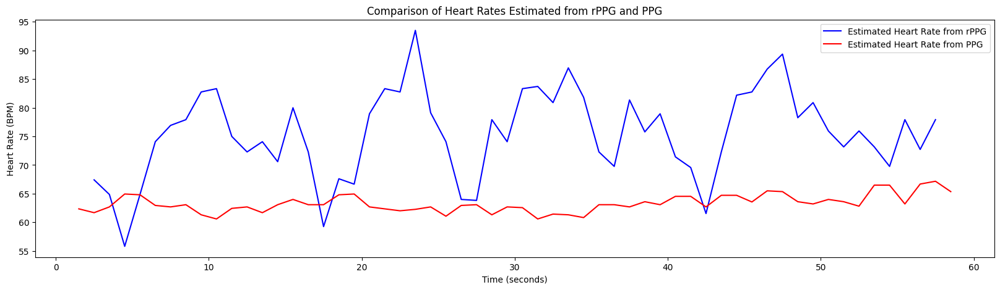

Average Estimated Heart Rate based Video: 75.43
Average Estimated Heart Rate based Pulse: 63.29
MAE: 12.74
RMSE: 14.48
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/6_3.npz...


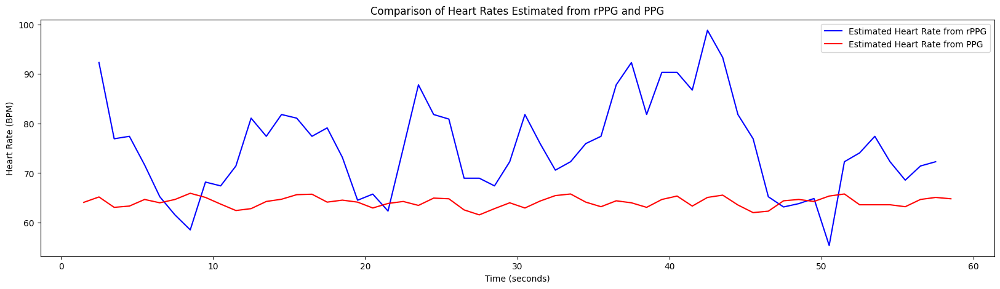

Average Estimated Heart Rate based Video: 75.22
Average Estimated Heart Rate based Pulse: 64.13
MAE: 11.79
RMSE: 14.54
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/7_0.npz...


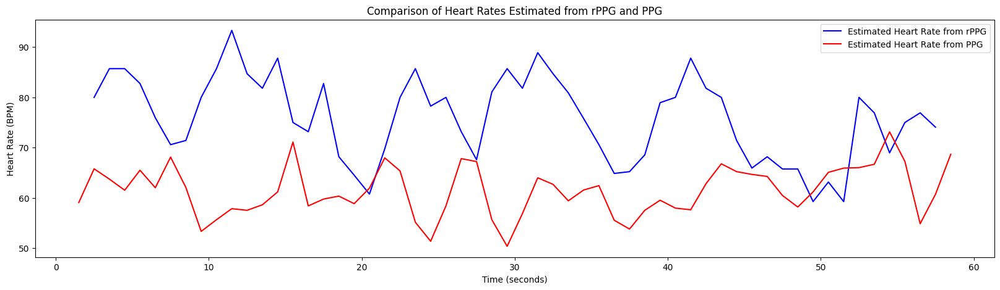

Average Estimated Heart Rate based Video: 75.92
Average Estimated Heart Rate based Pulse: 61.43
MAE: 14.83
RMSE: 17.96
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/7_1.npz...


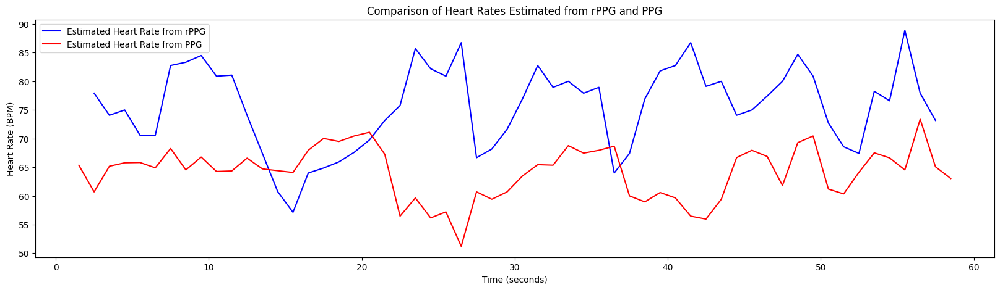

Average Estimated Heart Rate based Video: 75.59
Average Estimated Heart Rate based Pulse: 64.15
MAE: 12.39
RMSE: 14.72
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/7_2.npz...


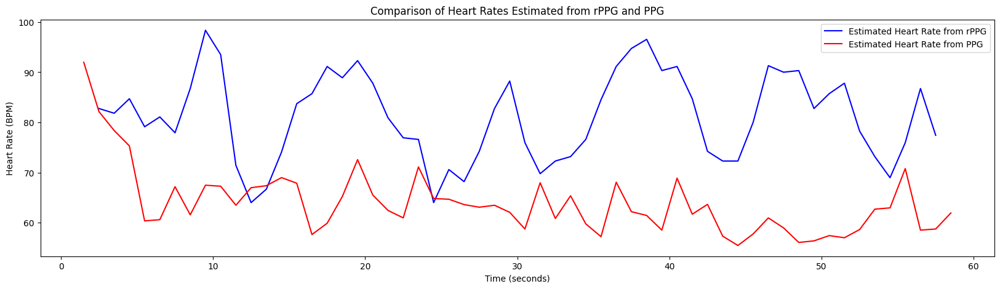

Average Estimated Heart Rate based Video: 81.11
Average Estimated Heart Rate based Pulse: 63.96
MAE: 17.63
RMSE: 20.32
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/7_3.npz...


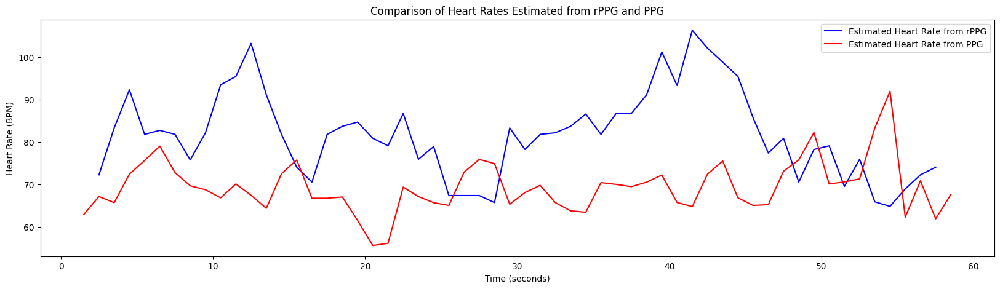

Average Estimated Heart Rate based Video: 81.88
Average Estimated Heart Rate based Pulse: 69.36
MAE: 15.00
RMSE: 17.87
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/8_0.npz...


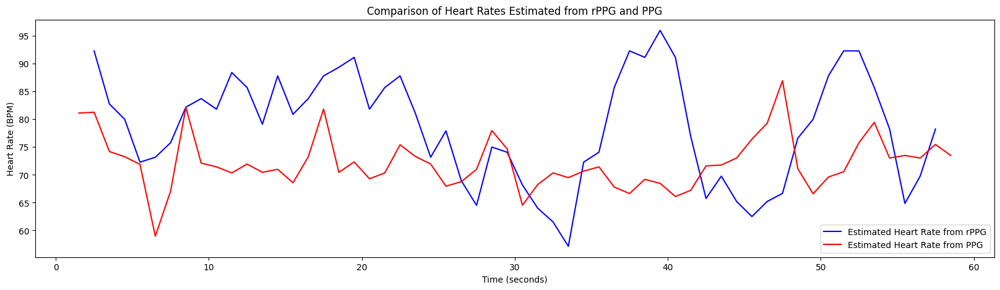

Average Estimated Heart Rate based Video: 78.56
Average Estimated Heart Rate based Pulse: 72.16
MAE: 10.20
RMSE: 12.51
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/8_1.npz...


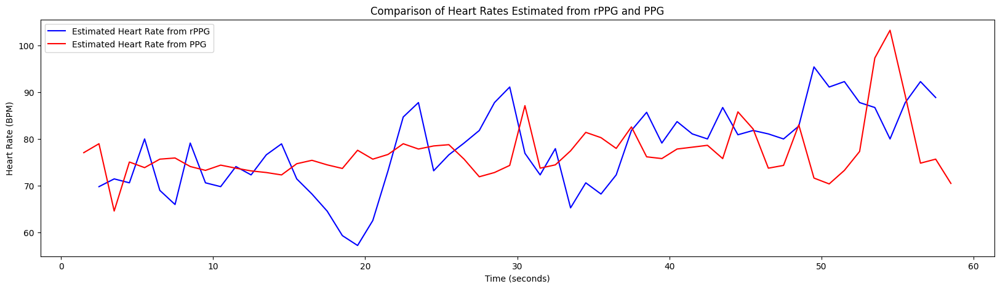

Average Estimated Heart Rate based Video: 77.80
Average Estimated Heart Rate based Pulse: 77.10
MAE: 7.79
RMSE: 9.53
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/8_2.npz...


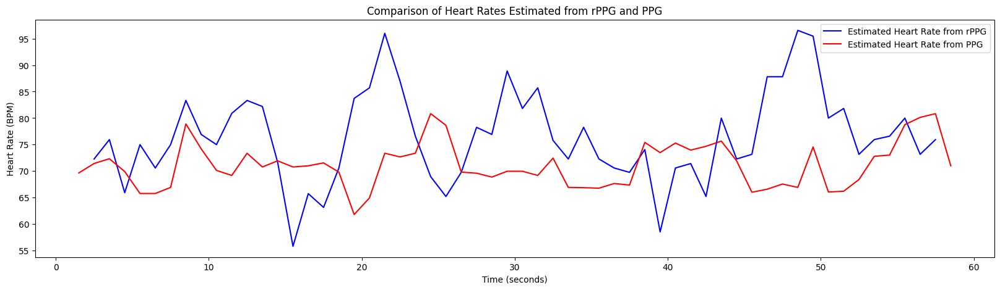

Average Estimated Heart Rate based Video: 76.37
Average Estimated Heart Rate based Pulse: 71.11
MAE: 9.47
RMSE: 12.08
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/8_3.npz...


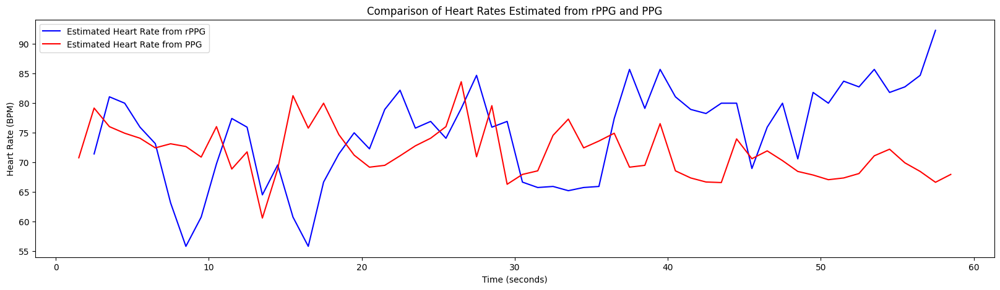

Average Estimated Heart Rate based Video: 74.96
Average Estimated Heart Rate based Pulse: 71.77
MAE: 8.00
RMSE: 10.00
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/9_0.npz...


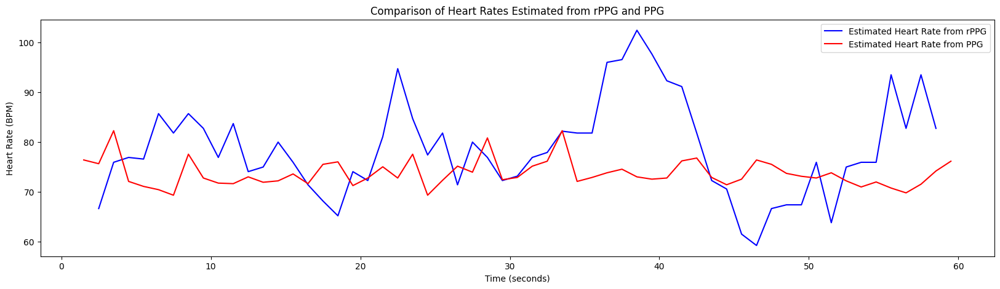

Average Estimated Heart Rate based Video: 78.69
Average Estimated Heart Rate based Pulse: 73.74
MAE: 8.74
RMSE: 11.31
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/9_1.npz...


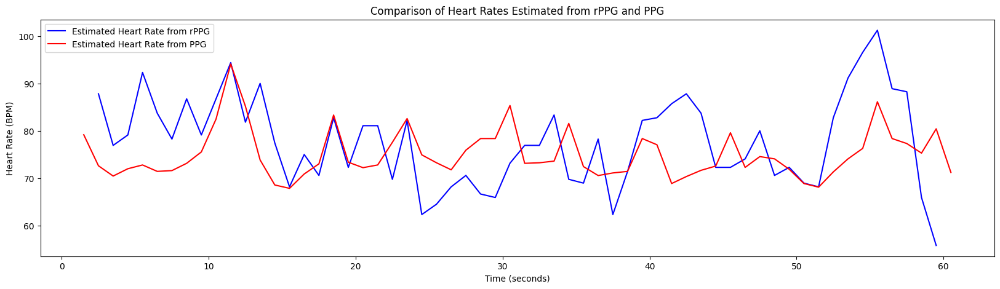

Average Estimated Heart Rate based Video: 77.72
Average Estimated Heart Rate based Pulse: 75.01
MAE: 8.61
RMSE: 10.49
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/9_2.npz...


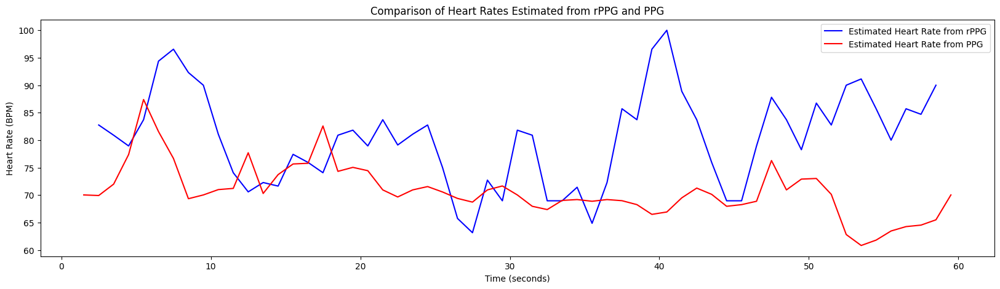

Average Estimated Heart Rate based Video: 80.31
Average Estimated Heart Rate based Pulse: 70.77
MAE: 10.42
RMSE: 13.27
---------------------------------------------------------------------------
Processing /content/drive/MyDrive/everglow/cohface-npz/9_3.npz...


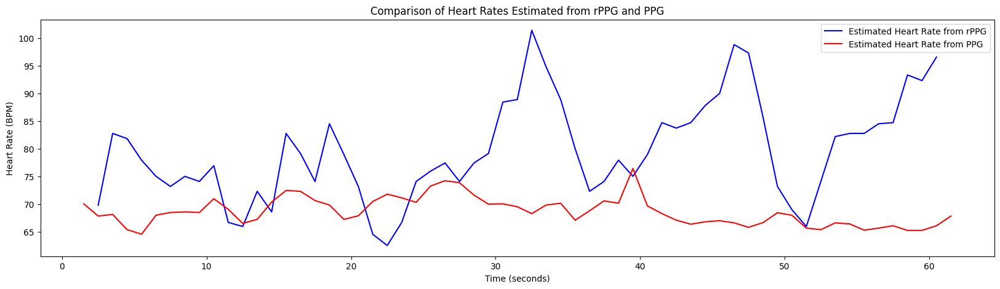

Average Estimated Heart Rate based Video: 79.64
Average Estimated Heart Rate based Pulse: 68.63
MAE: 11.84
RMSE: 14.80
---------------------------------------------------------------------------


In [40]:
directory = '/content/drive/MyDrive/everglow/cohface-npz'

rmse_list, mae_list, subject_list = process_npz_files(directory)

In [41]:
# 모든 파일의 MAE 출력
print("MAE List:", mae_list)
print("Average MAE across all files:", np.mean(mae_list))
print("---------------------------------------------------------------------------")

MAE List: [12.26175910686082, 12.334870125929719, 10.767566936909356, 7.361375604257164, 11.58042646471748, 11.092838895343629, 8.312548069261437, 7.504851067985626, 20.78267362663305, 13.883623649427314, 22.12333979833692, 18.324814396049263, 10.346981390414557, 9.088662622679722, 13.058037203032296, 10.314317612929807, 8.023765569577456, 8.429673446480093, 9.780515494763387, 7.584931848754322, 11.84447279050328, 9.241109457462697, 9.240522432695624, 7.809566320200648, 14.110511832274012, 16.53374759814694, 22.106222081750733, 18.96071573562346, 10.655823351971321, 9.416652666966497, 13.283847718168188, 9.9090940760199, 7.58701966736297, 8.129697571024852, 8.541113071104016, 10.086033387673227, 8.474392132515382, 8.444034976430492, 9.131246431603895, 9.915146469975758, 7.637365588376421, 9.667905740473458, 8.279969145686605, 7.930168070793769, 8.946318076508806, 4.183167873536303, 7.300924305980561, 9.4773071664274, 7.311829044502482, 12.218450674672036, 13.786134524524838, 8.44328800

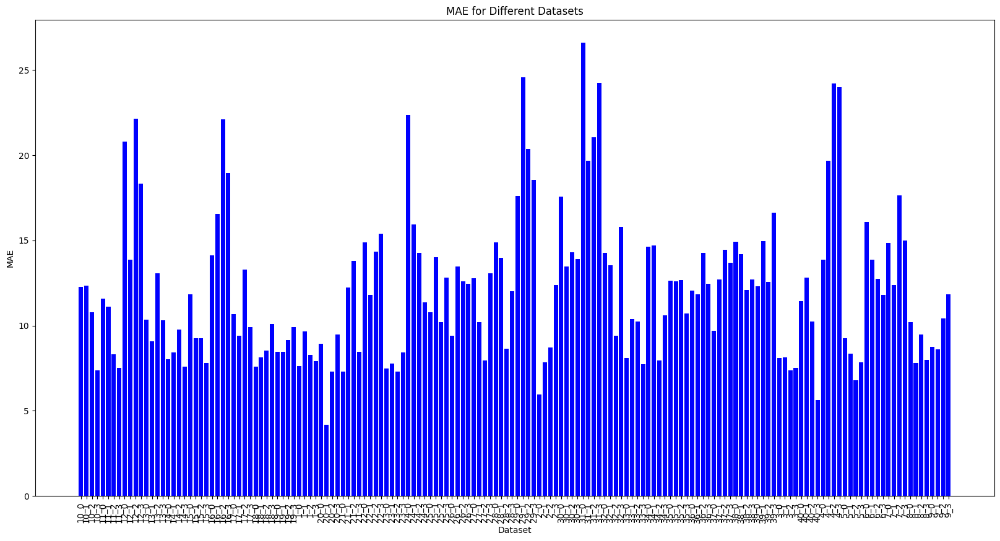

In [43]:
plt.figure(figsize=(20, 10))
plt.bar(subject_list, mae_list, color='blue')
plt.xlabel('Dataset')
plt.ylabel('MAE')
plt.title('MAE for Different Datasets')
plt.xticks(rotation='vertical')
plt.show()

In [44]:
# 모든 파일의 RMSE 출력
print("RMSE List:", rmse_list)
print("Average RMSE across all files:", np.mean(rmse_list))
print("---------------------------------------------------------------------------")

RMSE List: [14.840422543151423, 14.443970635325913, 13.745015615555678, 9.160740622378583, 13.984188749608728, 13.492423730167555, 9.928282526076773, 8.828027693910407, 22.8730522162615, 17.662583091268893, 24.38866202386923, 20.31266676479058, 12.134978631706723, 11.777019080134686, 16.013989493627175, 12.09816693393537, 10.177900980166491, 10.385120184198206, 11.257294821856945, 9.242669281691962, 15.60382061331278, 10.982975506267607, 11.795535113728032, 9.961217341922259, 16.484034211677564, 18.390831744585842, 24.313378819414794, 20.41402546810736, 13.821384640597985, 11.815664842258059, 16.029043003234456, 12.411636338977017, 9.180685478498216, 10.086218538934812, 10.981060933448521, 12.248087119214091, 10.140675448732155, 10.315381201910503, 11.108965495650649, 11.982049481508279, 9.611004372240831, 11.699099129504276, 10.45314739055767, 9.849265828822022, 11.850645087366422, 5.250405498615844, 9.535709990149568, 11.64607150306722, 9.139288629804033, 16.06522756118892, 16.357029

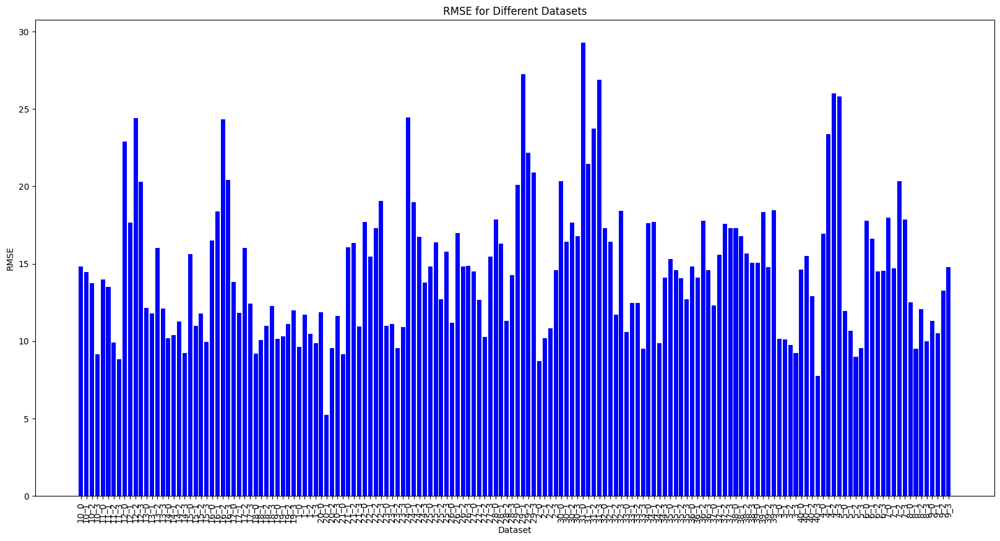

In [46]:
plt.figure(figsize=(20, 10))
plt.bar(subject_list, rmse_list, color='blue')
plt.xlabel('Dataset')
plt.ylabel('RMSE')
plt.title('RMSE for Different Datasets')
plt.xticks(rotation='vertical')
plt.show()